## Import 

### pytorch

In [31]:
from numpy import random
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import torch.nn.functional as F
from functools import reduce
from operator import add, itemgetter
import torch
import torch.nn as nn
from torch.nn import (Conv2d, BatchNorm2d, MaxPool2d, AvgPool2d, ReLU, BatchNorm1d, Linear, CrossEntropyLoss,ConstantPad2d)
from torch.nn import Module
from torchvision import transforms
from tqdm import tqdm
import numpy as np
import nibabel as nib
from torch.utils.data import Dataset

import torch
from torch._six import string_classes, int_classes

from torch.utils.data import DataLoader
from torch import autograd, optim
import torch.backends.cudnn as cudnn


import torchvision.utils as vutils
from PIL import Image
import numpy as np
from skimage.feature import peak_local_max


### Useful Francesco's code

In [2]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function


import numpy as np
import math

#import keras
#from keras.models import Sequential
#from keras.layers import Dense, Dropout, Flatten, BatchNormalization
#from keras.layers import Conv2D, MaxPooling2D, concatenate, Input
#from keras.losses import mean_squared_error
#from keras import backend as K
#from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler, EarlyStopping, TensorBoard
#from keras.models import Model
#from keras.preprocessing.image import load_img, img_to_array, array_to_img, ImageDataGenerator


import os
import subprocess
import numpy as np

import sys

#sys.path.append('spinalcordtoolbox/scripts/')
#sys.path.append('/home/fperdigon_local/spinalcordtoolbox/scripts/')
#from spinalcordtoolbox.image import Image
sys.path.insert(0, '/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/sct/sct/')
print(sys.path)
import spinalcordtoolbox.image as Image

from skimage.morphology import square
from skimage.morphology import dilation
import matplotlib
matplotlib.use("Agg")
import matplotlib.pyplot as plt
import time
import pickle

size_val = 512
testing_image =[]

['/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/sct/sct/', '/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python37.zip', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/lib-dynload', '', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages', '/home/GRAMES.POLYMTL.CA/luroub/anaconda3/envs/conda-37/lib/python3.7/site-packages/IPython/extensions', '/home/GRAMES.POLYMTL.CA/luroub/.ipython']


In [3]:
t=[4,5,6,7]
t[0:3]

[4, 5, 6]

## code from francesco to load the data into an array

In [3]:
# !/usr/bin/env python
#
# Prepare an homogeneous Dataset for training
# This code contains useful functions to create
# a dataset from the nifti images and labels
#
# author: Francisco Perdigon Romero
# Neuropoly



Poly_DataSet_path = '../Database/PolyDatabase_2/'
labels_orginal_fname = 'labels_disc_all_posterior.nii.gz'
labels_resampled_fname = 'labels_disc_all_posterior_r.nii.gz'
labels_dilated_fname = 'labels_disc_all_posterior_dilated.nii.gz'
sagittal_flatten_fname = 'flatten_sag.nii.gz'


IVSpace_order = ['APMJ', 'PMJ', 'Top C1', 'C2-C3', 'C3-C4', 'C4-C5', 'C5-C6', 'C6-C7', 'C7-T1',
             'T1-T2', 'T2-T3', 'T3-T4', 'T4-T5', 'T5-T6', 'T6-T7',
             'T7-T8', 'T8-T9', 'T10-T11', 'T11-T12', 'T12-L1',
             'L1-L2', 'L2-L3', 'L3-L4', 'L4-L5', 'L5-S1',
             'S1-S2', 'S2-S3', 'S3-S4', 'S4-S5']


def get_dataset_folders(Poly_DataSet_path = Poly_DataSet_path):
    '''
    Returns the path of where the NIFI files are
    It is assumed that the files are in the form duke: sct_testing/large/
    :param Poly_DataSet_path:
    :return:
    '''

    lf = os.listdir(Poly_DataSet_path)
    folders_list_nifti = []

    for f in lf:
        if f.startswith('.') == False and f.startswith('_') == False:
            for sf in os.listdir(Poly_DataSet_path + '/' + f):
                if sf.startswith('.') == False:
                    folders_list_nifti.append(Poly_DataSet_path + '/' + f + '/' + sf)
    return folders_list_nifti

def load_NIFTI_images_list_from_test_file(text_fname):
    '''
    Returns in a python list the files that are in a text file.
    The existence of the files is checked, if the files do not exist
    they are not included in the returned list
    :param text_fname: file path, the file contains a list of paths of images
    :return img_fname_list:
    '''
    file = open(text_fname, 'r')
    fileslist = file.readlines()
    file.close()
    img_fname_list = []
    for i in range(len(fileslist)):
        fileslist[i] = str.split(fileslist[i], '\n')[0]
        if os.path.exists(fileslist[i]):
            img_fname_list.append(fileslist[i])
        else:
            print('The file does not exist')
            print(fileslist[i])
    return img_fname_list

def save_NIFTI_images_list_to_text_file(fname_list, text_fname):

    file = open(text_fname, 'w')
    for i in range(len(fname_list)):
        file.write(fname_list[i] + '\n')
    file.close()

def get_parent_folder_from_NIFTI_file(fileslist):
    '''
    This function returns a list of the parent folder of the NIFTI files
    :param fileslist:
    :return:
    '''
    if type(fileslist) != list:
        fileslist = [fileslist]

    main_folders = []
    for f in fileslist:
        main_folders.append(os.path.dirname(os.path.abspath(f)))
    return main_folders

def get_NIFTI_type(folder_list, NIFTI_type):
    '''
    This function returns the existing elements of the
    NIFTI file type (NIFTI_type) contained in the folders (folder_list) \n
    :param folder_list: list of folders \n
    :param NIFTI_type: int \n
                       0 images in original resolution (ex: t2.nii.gz) \n
                       1 images resampled (ex: t2_r.nii.gz) \n
                       2 images sagittal flatten (ex: flatten_sag.nii.gz) \n
                       3 labels in original resolution (ex: labels_disc_all_posterior.nii.gz)\n
                       4 labels resampled (ex: labels_disc_all_posterior_r.nii.gz) \n
    :return:
    '''
    global sagittal_flatten_fname
    global labels_orginal_fname
    global labels_resampled_fname

    if type(folder_list) != list:
        folder_list = [folder_list]

    images_list_out = []
    labels_list_out = []
    sagittal_flatten_list_out = []
    out = []

    for f in folder_list:
        if NIFTI_type == 0: # 0 images in original resolution
            im_fname = f + '/' + str.split(f, '/')[-1] + '.nii.gz'
            if os.path.exists(im_fname):
                images_list_out.append(im_fname)
            else:
                print('ERROR, the file does not exist')
                print(im_fname)

        if NIFTI_type == 1: # 1 images resampled
            im_fname = f + '/' + str.split(f, '/')[-1] + '_r.nii.gz'
            if os.path.exists(im_fname):
                images_list_out.append(im_fname)
            else:
                print('ERROR, the file does not exist')
                print(im_fname)

        if NIFTI_type == 2: # 2 images sagittal flatten
            im_fname = f + '/' + sagittal_flatten_fname
            if os.path.exists(im_fname):
                images_list_out.append(im_fname)
            else:
                print('ERROR, the file does not exist')
                print(im_fname)

        if NIFTI_type == 3: # 3 labels in original resolution
            im_fname = f + '/' + str.split(f, '/')[-1] + '.nii.gz'
            lb_fname = f + '/' + labels_orginal_fname

            if os.path.exists(im_fname) and os.path.exists(lb_fname):
                images_list_out.append(im_fname)
                labels_list_out.append(lb_fname)
            else:
                print('ERROR, one of these files does not exist')
                print(im_fname)
                print(lb_fname)

        if NIFTI_type == 4:  # 4 labels resampled
            im_fname = f + '/' + str.split(f, '/')[-1] + '_r.nii.gz'
            lb_fname = f + '/' + labels_resampled_fname
            sf_fname = f + '/' + sagittal_flatten_fname

            if os.path.exists(im_fname) and os.path.exists(lb_fname):
                images_list_out.append(im_fname)
                labels_list_out.append(lb_fname)
                if os.path.exists(sf_fname):
                    sagittal_flatten_list_out.append(sf_fname)
                else:
                    sagittal_flatten_list_out.append('')
            else:
                print('ERROR, one of these files does not exist')
                print(im_fname)
                print(lb_fname)



        if NIFTI_type < 3:
            out = images_list_out
        elif NIFTI_type == 3:
            out = [images_list_out, labels_list_out]
        elif NIFTI_type == 4:
            out = [images_list_out, labels_list_out, sagittal_flatten_list_out]

    return out

def resample_nifti_images_SCT(files_list_nifti_img, resolution_mm ='1x1x1'):
    if type(files_list_nifti_img) != list:
        files_list_nifti_img = [files_list_nifti_img]
    for i in range(len(files_list_nifti_img)):
        print('Resizing subset %i of %i' %(i+1, len(files_list_nifti_img)))
        p = subprocess.Popen(['sct_resample', '-i', files_list_nifti_img[i], '-mm', resolution_mm, '-x', 'linear'],
                             stdout=subprocess.PIPE)
        p.wait()
    print('Done, %i images where resized' %(len(files_list_nifti_img)))

def dilate_labels_size(lb_fname_list):
    '''
    These function dilate the labels becauste some labels can be lost during the resample proccess
    :param lb_fname:
    :return:
    '''

    if type(lb_fname_list) != list:
        lb_fname_list = [lb_fname_list]

    for i in range(len(lb_fname_list)):
        print('Processing %i of %i' % (i + 1, len(lb_fname_list)))
        im_label = Image(lb_fname_list[i])
        im_label_original_orientation = im_label.orientation
        im_label.change_orientation(orientation='SAL')
        im_label.data = im_label.data.astype(int)

        im_label_dilated_data = np.zeros(im_label.data.shape, dtype=im_label.data.dtype)

        for LR_axis in range(im_label.data.shape[-1]):
            im_label_dilated_data[:, :, LR_axis] = dilation(im_label.data[:,:,LR_axis], square(5))

        im_label_dilated = im_label.copy()
        im_label_dilated.orientation = 'SAL'
        im_label_dilated.data = im_label_dilated_data
        im_label_dilated.change_orientation(orientation=im_label_original_orientation)
        lb_dilated_fname = str.split(lb_fname_list[i],'.nii.gz')[0] + '_dilated.nii.gz'
        im_label_dilated.setFileName(lb_dilated_fname)
        im_label_dilated.save()
    print ('Done, %i labels files dilated' %(len(lb_fname_list)))

def resample_nifti_labels_SCT(files_list_nifti_labels, resolution_mm ='1x1x1', dilate = True):
    global labels_dilated_fname
    global labels_resampled_fname
    if type(files_list_nifti_labels) != list:
        files_list_nifti_labels = [files_list_nifti_labels]

    for i in range(len(files_list_nifti_labels)):
        print('Resample label %i of %i' % (i + 1, len(files_list_nifti_labels)))

        if dilate: # dilate
            dilate_labels_size(files_list_nifti_labels[i])

        fn = get_parent_folder_from_NIFTI_file(files_list_nifti_labels[i])[0] + '/' + labels_dilated_fname
        fn_out = get_parent_folder_from_NIFTI_file(files_list_nifti_labels[i])[0] + '/' + labels_resampled_fname
        # resample
        p = subprocess.Popen(['sct_resample', '-i', fn, '-mm', resolution_mm, '-x', 'nn', '-o', fn_out],
                             stdout=subprocess.PIPE)
        p.wait()

        # delete dilated label file
        p = subprocess.Popen(['rm', fn],
                             stdout=subprocess.PIPE)
        p.wait()

        p = subprocess.Popen(['sct_label_utils', '-i', fn_out, '-cubic-to-point', '-o', fn_out],
                             stdout=subprocess.PIPE)
        p.wait()
    print('Done, %i labels where resized' %(len(files_list_nifti_labels)))

def set_orient_data_SCT(files_list, fov ='AIL'): #AIL

    for i in range(len(files_list)):
        print('Changing FOV subset %i of %i' % (i+1, len(files_list)))
        p = subprocess.Popen(['sct_image', '-i', files_list[i], '-setorient', fov],
                             stdout=subprocess.PIPE)
        p.wait()

    print('Done, FOV Changed for %i NIFTI files' % (len(files_list)))

def sagittal_flatten_SCT(files_list_nifti_img):

    for i in range(len(files_list_nifti_img)):
        print('Processing %i of %i' % (i+1, len(files_list_nifti_img)))

        # Get center line
        # using OptiC Method
        print('Getting centerline')
        p = subprocess.Popen(['sct_get_centerline', '-i', files_list_nifti_img[i], '-c', 't2'],
                             stdout=subprocess.PIPE)
        p.wait()
        print('Done')

        print('Doing Sagittal flatten')
        file_name_centerline = str.split(files_list_nifti_img[i], '/')[-1]
        file_name_centerline = str.split(file_name_centerline, '.nii.gz')[0] + '_centerline_optic.nii.gz'
        try:
            flatten_sagittal(files_list_nifti_img[i], file_name_centerline)
            print('Done')

        except:
            print('ERROR')
            files_list_nifti_img[i]

def flatten_sagittal(fname_im_anat, fname_centerline):
    import sys
    sys.path.append('../sct/sct/scripts/')
    from spinalcordtoolbox.image import Image
    from sct_image import get_orientation, set_orientation
    import numpy as np


    im_anat = Image(fname_im_anat)
    anat_ima_orientation_original = get_orientation_3d(im_anat)
    im_centerline = Image(fname_centerline)


    # Reorient input data into RL PA IS orientation
    im_anat.change_orientation(orientation='RPI')

    im_centerline.change_orientation(orientation='RPI')

    X = np.zeros(im_centerline.data.shape[-1], dtype=np.int16)
    Y = np.zeros(im_centerline.data.shape[-1], dtype=np.int16)
    for z_axis in range(im_centerline.data.shape[-1]):
        X[z_axis], Y[z_axis] = im_centerline.data[:, :, z_axis].nonzero()

    im_x, im_y, im_z = im_anat.data.shape

    imf_x = 2 * im_x + 1 # With these value for sure the loop will not trespass the max index

    im_flatten_sag_data = np.zeros((imf_x, im_y, im_z), dtype=im_anat.data.dtype)

    for z_axis in range(len(X)):
        x_start = int(imf_x/2) - X[z_axis]
        x_end = x_start + im_x
        im_flatten_sag_data[x_start : x_end,:,z_axis] = im_anat.data[:,:,z_axis]

    import os
    im_anat_dir = os.path.dirname(os.path.abspath(fname_im_anat))

    im_flatten_sag = im_anat.copy()
    im_flatten_sag.orientation = 'RPI'
    im_flatten_sag.data = im_flatten_sag_data
    im_flatten_sag.change_orientation(orientation=anat_ima_orientation_original)
    im_flatten_sag.setFileName(im_anat_dir + '/flatten_sag.nii.gz')
    im_flatten_sag.save()

    print('Sagittal flatten saved on: ' + im_anat_dir + '/flatten_sag.nii.gz')

def shuffle_data(img_files_list, lab_files_list):
    # Shuffle the data
    indx = range(img_files_list.__len__())
    np.random.shuffle(indx)

    # Print the indx to save for latter get the same train schema
    # print(indx)

    ifpl = []
    lfpl = []

    for i in range(len(img_files_list)):
        ifpl.append(img_files_list[indx[i]])
        lfpl.append(lab_files_list[indx[i]])
    return [ifpl, lfpl]

def viewer_images_labels(iml, lbl, check_images = False, start = 0, pause_time = 0.5, figure_block =False, labels_color = 'r'):

    fig = plt.figure()

    for i in range(start,len(iml)):

        print(str(i + 1) + '/' + str(len(iml)))
        print(iml[i])
        im = Image(iml[i])
        im.change_orientation(orientation='SAL')
        lb = get_labels_value(lbl[i])

        mid_sag_plane = im.data.shape[-1]/2
        plt.imshow(im.data[:, :, mid_sag_plane], 'gray')
        for j in range(len(lb)):
            plt.plot(lb[j][0], lb[j][1], labels_color + 'o')
            plt.text(lb[j][0] + 5, lb[j][1], str(lb[j][3]) , {'color': labels_color, 'fontsize': 12})

        plt.axis([0, im.data[:, :, mid_sag_plane].shape[1], im.data[:, :, mid_sag_plane].shape[0], 0])
        plt.pause(pause_time)

        plt.show(block=figure_block)

        if check_images == True:
            print('The image or labels are OK?(y/n)')
            input = str(raw_input('Input:'))

            if input == 'y':
                text_file_OK = open("_OK.txt", "a")
                text_file_OK.write(iml[i] + '\n')
                text_file_OK.close()
            else:
                text_file_BAD = open("_BAD.txt", "a")
                text_file_BAD.write(iml[i] + '\n')
                text_file_BAD.close()

        fig.clear()

def make_Labels_annotation_from_list(fileslist, label_fname, start = 1):
    if type(fileslist) != list:
        fileslist = [fileslist]

    for i in range(start-1, len(fileslist)):
        print('Processing %i of %i' % (i + 1, len(fileslist)))
        print(fileslist[i])


        file_dir = os.path.dirname(os.path.abspath(fileslist[i]))
        file_out = file_dir + '/' + label_fname
        p = subprocess.Popen(['sct_label_utils', '-i', fileslist[i], '-create-viewer', '50, 49, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32', '-o', file_out ],
                             stdout=subprocess.PIPE)
        p.wait()
        print('Done')

def get_Img_max_size(img_fname_list, px_max=512):

    img_fname_list_out = []

    for i in range(len(img_fname_list)):

        im = Image(img_fname_list[i])
        im.change_orientation(orientation='SAL')

        mid_sag_slice = im.data.shape[-1]/2
        mid_sag_plane = im.data[:, :, mid_sag_slice]

        print(str(i + 1) + ';' + img_fname_list[i] + ';' + str(mid_sag_plane.shape[0]) + ';' + str(mid_sag_plane.shape[1]))

        if mid_sag_plane.shape[0] <= px_max and mid_sag_plane.shape[1] <= px_max:
            img_fname_list_out.append(img_fname_list[i])

    return img_fname_list_out

def splitDataset(img_fname_list, train =60, val = 20, test = 20):
    ds_size = len(img_fname_list)
    train_ds = img_fname_list[0:int(ds_size*(train/100.0))]
    val_ds = img_fname_list[int(ds_size*(train/100.0)) : int(ds_size*(train/100.0)) + int(ds_size*(val/100.0))]
    test_ds = img_fname_list[int(ds_size*(train/100.0)) + int(ds_size*(val/100.0)) : -1 ]
    return [train_ds, val_ds, test_ds]

def get_data_containing_x_label(lbs_fname_list, label_number):

    ll = []

    for i in range(len(lbs_fname_list)):
        print('Looking for desired labels %i of %i' % (i + 1, len(lbs_fname_list)))
        lb_list = get_labels_value(lbs_fname_list[i])
        for lbs in range(len(lb_list)):
            if lb_list[lbs][3] == label_number:
                ll.append(lbs_fname_list[i])

    return ll

def get_data_containing_label_range(lbs_fname_list, label_start, label_end):
    """"
    These function search the images that contains all the labels in a range.
    For now only work on IVD labels, no APMJ(49) or PMJ(50)
    """

    ll = []

    for i in range(len(lbs_fname_list)):
        print('Looking for desired labels %i of %i' % (i + 1, len(lbs_fname_list)))
        lb_list = get_labels_value(lbs_fname_list[i])
        c = 0
        for lbs in range(len(lb_list)):
            for j in range(label_start, label_end):
                if lb_list[lbs][3] == j:
                    c = c + 1
        if c == label_end - label_start:
            ll.append(lbs_fname_list[i])

    return ll

def get_print_label_info(lbs_fname_list):

    for i in range(len(lbs_fname_list)):

        lbs_list = get_labels_value(lbs_fname_list[i])
        lb_min = 48
        lb_max = 0

        lb_50_flag = False
        lb_49_flag = False
        for ll in range(len(lbs_list)):
            for l in range(len(lbs_list)):

                if lbs_list[l][3] == 50:
                    lb_50_flag = True
                if lbs_list[l][3] == 49:
                    lb_49_flag = True
                if lbs_list[l][3] < lb_min:
                    lb_min = lbs_list[l][3]
                if lbs_list[l][3] > lb_max and lbs_list[l][3] != 50 and lbs_list[l][3] != 49:
                    lb_max = lbs_list[l][3]

        print(lbs_fname_list[i] + ';' + str(lb_min) + ';' + str(lb_max) + ';' + str(lb_50_flag) + ';' + str(lb_49_flag))


# Data Image oriented
def get_mid_sagittal_slice_2_list_of_np_array(img_NIFTI_fnames):

    if type(img_NIFTI_fnames) != list:
        img_NIFTI_fnames = [img_NIFTI_fnames]

    img_list = []
    for i in range(len(img_NIFTI_fnames)):

        print('Extracting mid sagittal plane ' + str(i + 1) + '/' + str(len(img_NIFTI_fnames)))

        im = Image(img_NIFTI_fnames[i])
        im.change_orientation(orientation='SAL')

        mid_sag_plane = im.data.shape[-1]/2
        img_list.append(im.data[:, :, mid_sag_plane])

    return img_list

def images_normalization(img_list, std = True):
    if type(img_list) != list:
        img_list = [img_list]
    img_norm_list = []
    for i in range(len(img_list)):
        #print('Normalizing ' + str(i + 1) + '/' + str(len(img_list)))
        img = img_list[i] - np.mean(img_list[i])  # zero-center
        if std:
            img_std = np.std(img)  # normalize
            epsilon = 1e-100
            img = img / (img_std + epsilon)  # epsilon is used in order to avoid by zero division
        img_norm_list.append(img)
    return img_norm_list

def add_zero_padding(img_list, x_val = 512, y_val=512):
    if type(img_list) != list:
        img_list = [img_list]
    img_zero_padding_list = []
    for i in range(len(img_list)):
        print(i)
        #print('Doing zero-padding ' + str(i + 1) + '/' + str(len(img_list)))
        img = img_list[i]
        img_tmp = np.zeros((x_val, y_val,1), dtype=np.float64)
        img_tmp[0:img.shape[0], 0:img.shape[1],0] = img
        img_zero_padding_list.append(img_tmp)

    return img_zero_padding_list

# Data Label oriented
def get_labels_value(lfp):
    " These function return a list of labels in LR FOV"
    im_label = Image(lfp)
    im_label.change_orientation(orientation='SAL')
    im_label.data = im_label.data.astype(int)

    labels = []
    label_flag = []
    for i in range(34):
        label_flag.append(False)


    for LR_axis in range(im_label.data.shape[-1]):

        Y,X = np.where(im_label.data[:,:,LR_axis] == 50)
        if X.size > 0 and Y.size > 0 and label_flag[0] == False:
            labels.append([X[0], Y[0], LR_axis, 50])
            label_flag[0] = True

        Y, X = np.where(im_label.data[:, :, LR_axis] == 49)
        if X.size > 0 and Y.size > 0 and label_flag[1] == False:
            labels.append([X[0], Y[0], LR_axis, 49])
            label_flag[1] = True

        Y, X = np.where(im_label.data[:, :, LR_axis] == 1)
        if X.size > 0 and Y.size > 0 and label_flag[2] == False:
            labels.append([X[0], Y[0], LR_axis, 1])
            label_flag[2] = True

        for i in range(3,34):
            Y, X = np.where(im_label.data[:, :, LR_axis] == i)
            if X.size > 0 and Y.size > 0 and label_flag[i] == False:
                labels.append([X[0], Y[0], LR_axis, i])
                label_flag[i] = True
    return labels

def get_labels_values_list(label_path_list):
    Labels = []
    for i in range(len(label_path_list)):
        print('Getting labels ' + str(i + 1) + '/' + str(len(label_path_list)))
        single_image_labels = get_labels_value(label_path_list[i])
        Labels.append(single_image_labels)

    return Labels

def get_x_label_coordenates_list(lbs_list, label_number):
    ll = []

    for i in range(len(lbs_list)):
        #print('Obtaining coordenates %i of %i' % (i + 1, len(lbs_list)))

        for lbs in range(len(lbs_list[i])):
            
            if lbs_list[i][lbs][3] == label_number:
                list_cood=lbs_list[i][lbs][1:3]
                
                ll.append([list_cood[1],list_cood[0]])
            #if lbs==len(lbs_list[i])-1 and 

    return ll

def get_x_label_coordenates_exist(lbs_list, label_number):
    ll = False
    for lbs in range(len(lbs_list)):
        if lbs_list[lbs][3] == label_number:
            ll = True
    return ll

def label_2_IVSpace(label_number):
    global IVSpace_order
    IVSpace_name = ''
    if label_number == 50:
        IVSpace_name = IVSpace_order[0]
    elif label_number == 49:
        IVSpace_name = IVSpace_order[1]
    elif label_number == 1:
        IVSpace_name = IVSpace_order[2]
    else:
        IVSpace_name = IVSpace_order[label_number]

    return IVSpace_name

def label2MaskMap(data, c_dx = 0, c_dy = 0, radius = 10, normalize = False):
    """
    Generate a Mask map from the coordenates
    :param M, N: dimesion of output
    :param position: position of the label
    :param radius: is the radius of the gaussian function
    :return: a MxN normalized array
    """

    # Our 2-dimensional distribution will be over variables X and Y
    (M,N)=(512,512)
    if len(data)<=2:
        data = [data]

    maskMap = []
    for index, value in enumerate(data):
        x,y = value

        #Correct the labels
        x = x + c_dx
        y = y + c_dy

        X = np.linspace(0, M - 1, M)
        Y = np.linspace(0, N - 1, N)
        X, Y = np.meshgrid(X, Y)
        # Pack X and Y into a single 3-dimensional array
        pos = np.empty(X.shape + (2,))
        pos[:, :, 0] = X
        pos[:, :, 1] = Y

        # Mean vector and covariance matrix
        mu = np.array([x, y])
        Sigma = np.array([[radius, 0], [0, radius]])

        # The distribution on the variables X, Y packed into pos.
        Z = multivariate_gaussian(pos, mu, Sigma)

        # Normalization
        if normalize:
            Z = Z * (1 / np.max(Z))
        else:
            # 8bit image values (the loss go to inf+)
            Z = Z * (1 / np.max(Z))
            Z = np.asarray(Z * 255, dtype=np.uint8)

        maskMap.append(Z)

    if len(maskMap) == 1:
        maskMap = maskMap[0]

    return np.asarray(maskMap)

def multivariate_gaussian(pos, mu, Sigma):
    """
    Return the multivariate Gaussian distribution on array.

    pos is an array constructed by packing the meshed arrays of variables
    x_1, x_2, x_3, ..., x_k into its _last_ dimension.

    """

    n = mu.shape[0]
    Sigma_det = np.linalg.det(Sigma)
    Sigma_inv = np.linalg.inv(Sigma)
    N = np.sqrt((2*np.pi)**n * Sigma_det)
    # This einsum call calculates (x-mu)T.Sigma-1.(x-mu) in a vectorized
    # way across all the input variables.
    fac = np.einsum('...k,kl,...l->...', pos-mu, Sigma_inv, pos-mu)

    return np.exp(-fac / 2) / N

#bo = get_NIFTI_images_list_from_test_file('sagittal_flatten_BAD_old.txt')
#bof = get_parent_folder_from_NIFTI_file(bo)
#bof = get_dataset_folders(Poly_DataSet_path)
#[im_org, lb_org] = get_NIFTI_type(bof, 3)
#make_Labels_annotation_from_list(im_org, labels_orginal_fname, start=1)

#resample_nifti_labels_SCT(lb_org)
#resample_nifti_labels_SCT('/Users/fperdigon_admin/Documents/PyCharm/deep_vl_LOCAL/Database/PolyDatabase_2/twh_allan_e24408/t2/' + labels_orginal_fname)
#viewer_images_labels(im_org, lb_org, check_images=True)

#[im_resampled, lb_resampled, im_sagittal] = get_NIFTI_type(bof,4)

#make_Labels_annotation_from_list(im_resampled, labels_resampled_fname, start=1)

#viewer_images_labels(im_sagittal, lb_resampled, check_images= True)

#print('')


In [4]:
def check_label(path_dataset):
    tab=[]
    t=os.listdir(path_dataset)
    for i in range (len(t)):
        path_tmp=path_dataset+t[i]+'/t2/labels_disc_all_posterior_order_r.nii.gz'
        im=nib.load(path_tmp)
        arr=np.array(im.dataobj)
        if arr.nonzero()[0][0]==np.round(arr.shape[0]/2):
            tab.append(t[i])
    return tab

In [14]:
essai=check_label()

TypeError: check_label() missing 1 required positional argument: 'path_dataset'

In [5]:
def load_Data(DataSet_path):
    size_val = 512
    fname_TXT = './fnames_less_512.txt'
    store_folder='./storage/'

    if os.path.exists(fname_TXT) == False:
        bof = get_dataset_folders(DataSet_path)
        [im_resampled, lb_resampled, im_sagittal] = get_NIFTI_type(bof, 4)
        fname_list_under_512 = get_Img_max_size(im_sagittal, px_max=size_val)
        [shuffled_img, shuffled_lbs] = shuffle_data(fname_list_under_512, fname_list_under_512)
        vlds.save_NIFTI_images_list_to_text_file(shuffled_img, fname_TXT)
    else:
        shuffled_img = load_NIFTI_images_list_from_test_file(fname_TXT)

    data_dir_list = get_parent_folder_from_NIFTI_file(shuffled_img)

    load_pkl = True

    if load_pkl == False:

        [im_resampled, lb_resampled, im_sagittal] = vlds.get_NIFTI_type(data_dir_list, 4)
        labels_fname_list = lb_resampled

        labels_fname_list = get_data_containing_label_range(labels_fname_list, start_lb,end_lb + 1)

        print('The size of the dataset is %i' % (len(labels_fname_list)))
        data_dir_list = get_parent_folder_from_NIFTI_file(labels_fname_list)
        [train_ds, val_ds, test_ds] = splitDataset(data_dir_list, train=80, val=10, test=10)
        print('The size of the training dataset is %i' % (len(train_ds)))
        print('The size of the validation dataset is %i' % (len(val_ds)))
        print('The size of the test dataset is %i' % (len(test_ds)))
        [train_im_resampled, train_lb_resampled, train_im_sagittal_flatten] = get_NIFTI_type(train_ds, 4)
        [val_im_resampled, val_lb_resampled, val_im_sagittal_flatten] = get_NIFTI_type(val_ds, 4)
        [test_im_resampled, test_lb_resampled, test_im_sagittal_flatten] = get_NIFTI_type(test_ds, 4)

        save_NIFTI_images_list_to_text_file(train_im_sagittal_flatten, store_folder + "train_set.txt")
        save_NIFTI_images_list_to_text_file(val_im_sagittal_flatten, store_folder + "val_set.txt")
        save_NIFTI_images_list_to_text_file(test_im_sagittal_flatten, store_folder + "test_set.txt")

        # Load Images and labels
        train_ds_img = get_mid_sagittal_slice_2_list_of_np_array(train_im_sagittal_flatten)
        train_ds_label = get_labels_values_list(train_lb_resampled)
        val_ds_img = get_mid_sagittal_slice_2_list_of_np_array(val_im_sagittal_flatten)
        val_ds_label = get_labels_values_list(val_lb_resampled)
        test_ds_img = get_mid_sagittal_slice_2_list_of_np_array(test_im_sagittal_flatten)
        test_ds_label = get_labels_values_list(test_lb_resampled)

        with open(store_folder + 'train_ds_img.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(train_ds_img, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'train_ds_label.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(train_ds_label, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'val_ds_img.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(val_ds_img, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'val_ds_label.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(val_ds_label, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'test_ds_img.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(test_ds_img, output, pickle.HIGHEST_PROTOCOL)
        with open(store_folder + 'test_ds_label.pkl', 'wb') as output:  # Overwrites any existing file.
            pickle.dump(test_ds_label, output, pickle.HIGHEST_PROTOCOL)

    else:

        with open(store_folder + 'train_ds_img.pkl', 'rb') as input:
            train_ds_img = pickle.load(input,encoding='latin1')
        with open(store_folder + 'train_ds_label.pkl', 'rb') as input:
            train_ds_label = pickle.load(input,encoding='latin1')
        with open(store_folder + 'val_ds_img.pkl', 'rb') as input:
            val_ds_img = pickle.load(input,encoding='latin1')
        with open(store_folder + 'val_ds_label.pkl', 'rb') as input:
            val_ds_label = pickle.load(input,encoding='latin1')
        with open(store_folder + 'test_ds_img.pkl', 'rb') as input:
            test_ds_img = pickle.load(input,encoding='latin1')
        with open(store_folder + 'test_ds_label.pkl', 'rb') as input:
            test_ds_label = pickle.load(input,encoding='latin1')

    # Normalize images
    train_ds_img = images_normalization(train_ds_img)
    val_ds_img = images_normalization(val_ds_img)
    test_ds_img = images_normalization(test_ds_img)

    # Zero padding
    train_ds_img = add_zero_padding(train_ds_img, x_val=size_val, y_val=size_val)
    val_ds_img = add_zero_padding(val_ds_img, x_val=size_val, y_val=size_val)
    test_ds_img = add_zero_padding(test_ds_img, x_val=size_val, y_val=size_val)

    # Convert images to np.array
    train_ds_img = np.array(train_ds_img)
    val_ds_img = np.array(val_ds_img)
    test_ds_img = np.array(test_ds_img)

    return [train_ds_img, val_ds_img, test_ds_img, train_ds_label, val_ds_label, test_ds_label]

In [6]:
def mask2label(path_label):
    a=nib.load(path_label)
    arr=np.array(a.dataobj)

    list_label_image=[]
    for i in range (len(arr.nonzero()[0])):
        x=arr.nonzero()[0][i]
        y=arr.nonzero()[1][i]
        z=arr.nonzero()[2][i]
        list_label_image.append([x,y,z,arr[x,y,z]])
    list_label_image.sort(key=lambda x: x[3])
    return(list_label_image)

def get_midNifti(path_im,ind):
    a=nib.load(path_im)
    arr=np.array(a.dataobj)
    return arr[ind,:,:]

In [7]:
def load_Data_lucas(DataSet_path):
    size_val = 512
    ds_image=[]
    ds_label=[]
    list_dir=os.listdir(DataSet_path)
    list_dir.sort()
    if '.DS_Store' in list_dir:
        list_dir.remove('.DS_Store')
    a=len(list_dir)
    for i in range (a):
        path_tmp=DataSet_path+list_dir[i]+'/t2/'
        tmp_label=mask2label(path_tmp+'labels_disc_all_posterior_order_r.nii.gz')
        print(path_tmp)
        index_mid=tmp_label[0][0]
        print(index_mid)
        mid_slice=get_midNifti(path_tmp+'t2_order_r_flatten.nii.gz',index_mid)
        print(mid_slice.shape)
        if mid_slice.shape[0]>512:
            print('removed')
            pass
        elif mid_slice.shape[1]>512:
            print('removed')
            pass
        else:
            ds_image.append(mid_slice)
            ds_label.append(tmp_label)
    
    ds_image = images_normalization(ds_image)
    

    # Zero padding
    ds_image = add_zero_padding(ds_image, x_val=size_val, y_val=size_val)
    #val_ds_img = add_zero_padding(val_ds_img, x_val=size_val, y_val=size_val)
    #test_ds_img = add_zero_padding(test_ds_img, x_val=size_val, y_val=size_val)

    # Convert images to np.array
    ds_image = np.array(ds_image)
        
        
    return [ds_image,ds_label] 

In [8]:
ds=load_Data_lucas('./PolyDatabase_2/')

./PolyDatabase_2/bwh_20160204_Phillips-1.5T/t2/
25
(460, 460)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS10/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS11/t2/
25
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS12/t2/
22
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS13/t2/
31
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS14/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS15/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS17/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS18/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS19/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS2/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS3/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS4/t2/
25
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS5/t2/
28
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS6/t2/
22
(200, 200)
./PolyDatabase_2/bwh_20160615-Bakshi_CIS7/t2/
22
(200, 200)
./PolyDatabase_2/bwh_20160615

./PolyDatabase_2/korea_jisun_MA-SH/t2/
36
(250, 250)
./PolyDatabase_2/korea_jisun_WOO-JE/t2/
34
(250, 250)
./PolyDatabase_2/mgh-3t_connectome_MS-SC-002/t2/
27
(256, 256)
./PolyDatabase_2/mgh-3t_connectome_MS-SC-004-011916/t2/
22
(256, 256)
./PolyDatabase_2/mgh-3t_connectome_MS-SC-005-011916/t2/
24
(256, 256)
./PolyDatabase_2/mgh-3t_connectome_MS-SC-005-041216/t2/
22
(256, 256)
./PolyDatabase_2/milan_2017-filippi_001/t2/
16
(248, 248)
./PolyDatabase_2/milan_2017-filippi_003/t2/
18
(248, 248)
./PolyDatabase_2/milan_2017-filippi_005/t2/
16
(248, 248)
./PolyDatabase_2/milan_2017-filippi_007/t2/
18
(248, 248)
./PolyDatabase_2/milan_2017-filippi_008/t2/
16
(248, 248)
./PolyDatabase_2/milan_2017-filippi_009/t2/
18
(248, 248)
./PolyDatabase_2/milan_2017-filippi_010/t2/
16
(248, 248)
./PolyDatabase_2/milan_2017-filippi_012/t2/
18
(248, 248)
./PolyDatabase_2/milan_2017-filippi_013/t2/
18
(248, 248)
./PolyDatabase_2/milan_2017-filippi_014/t2/
16
(248, 248)
./PolyDatabase_2/milan_2017-filippi_015/

./PolyDatabase_2/paris_pradat_100/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_101/t2/
24
(280, 280)
./PolyDatabase_2/paris_pradat_112/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_115/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_116/t2/
28
(280, 280)
./PolyDatabase_2/paris_pradat_117/t2/
25
(280, 280)
./PolyDatabase_2/paris_pradat_119/t2/
28
(280, 280)
./PolyDatabase_2/paris_pradat_123/t2/
27
(280, 280)
./PolyDatabase_2/paris_pradat_124/t2/
25
(280, 280)
./PolyDatabase_2/paris_pradat_143/t2/
28
(280, 280)
./PolyDatabase_2/paris_pradat_15/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_16/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_17/t2/
28
(280, 280)
./PolyDatabase_2/paris_pradat_18/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_20/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_38/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_39/t2/
25
(280, 280)
./PolyDatabase_2/paris_pradat_41/t2/
23
(280, 280)
./PolyDatabase_2/paris_pradat_42/t2/
23
(280, 280)
./PolyDatabase_2/pari

./PolyDatabase_2/twh_allan_e26406/t2/
28
(200, 200)
./PolyDatabase_2/twh_allan_e26407/t2/
25
(200, 200)
./PolyDatabase_2/twh_allan_e26486/t2/
29
(200, 200)
./PolyDatabase_2/twh_allan_e26602/t2/
28
(200, 200)
./PolyDatabase_2/twh_allan_e26603/t2/
29
(200, 200)
./PolyDatabase_2/twh_allan_e26840/t2/
25
(200, 200)
./PolyDatabase_2/twh_allan_e26841/t2/
21
(200, 200)
./PolyDatabase_2/twh_allan_e26907/t2/
25
(200, 200)
./PolyDatabase_2/twh_allan_e27115/t2/
25
(200, 200)
./PolyDatabase_2/twh_allan_e27116/t2/
23
(200, 200)
./PolyDatabase_2/twh_allan_e27342/t2/
21
(200, 200)
./PolyDatabase_2/twh_allan_e27715/t2/
29
(200, 200)
./PolyDatabase_2/twh_allan_e27871/t2/
25
(200, 200)
./PolyDatabase_2/twh_allan_e28022/t2/
27
(200, 200)
./PolyDatabase_2/twh_allan_e31412/t2/
25
(200, 200)
./PolyDatabase_2/twh_allan_e31494/t2/
24
(200, 200)
./PolyDatabase_2/ucl_2017-ciccarelli_B0034312-2011-01247/t2/
19
(256, 256)
./PolyDatabase_2/ucl_2017-ciccarelli_B0185306-2013-02676/t2/
16
(256, 256)
./PolyDatabase_2/u

## Modified francesco's code

Useful to extract patches and load them into an array. The array will then be fed to the dataloader (patch_exctracting function ). I added a second code which extract groundtruth on the whole image (extract_groundtruth fn)

In [9]:
def patch_extracting(DataSet, start_lb, end_lb, train = True, test = False):
   

    [train_ds_img,  train_ds_label] = DataSet

    global testing_image
    testing_image = train_ds_img[0]

    epochs = 30
    batch_size = 10

    # Selecting only the train images that contatins the end label
    # in these case 15 --> from C2-C3 to T7-T8 disc
    # remember that with these method big amount of training images will be descarted

    tmp_train_labels = []
    tmp_train_img = []
    label_number = 3

    for lbs in range(len(train_ds_label)):
         if get_x_label_coordenates_exist(train_ds_label[lbs], label_number):
                tmp_train_img.append(train_ds_img[lbs])
                tmp_train_labels.append(train_ds_label[lbs])

    train_ds_img = full[0][50:400]
    train_ds_label = tmp_train_labels
    print("===== DETECTED " + str(train_ds_img.shape[0]) + " images that contains label no. " + str(label_number) + " =====")

    # Now make the trining datases using only the subset with that contain the "label_number" label
    print("Extracting patches")
    tmp_train_patch = []
    tmp_train_mask_patch = []
    #for lbn in range(3, label_number):
    #for lbn in [label_number-1]:
    #for lbn in [3,label_number]:
    if label_number==3:
        lbn=3
        train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,lbn)
        train_lbs_tmp = np.array(train_lbs_tmp)

        #train_lbs_tmp_mask = label2MaskMap(train_lbs_tmp, radius = 20, normalize = True)
        train_lbs_tmp_mask=full[1][50:400]
        for i in range(train_ds_img.shape[0]):

            train_patch = []
            train_mask_patch = []
            train_patch_negative = []
            train_mask_patch_negative = []

            # Make patch
            dx = 30
            dy = 30
            coord=peak_local_max(full[1][i][:,:,0],min_distance=1, threshold_abs=0.9999999)
            x=coord[0][1]
            y=coord[0][0]
            org_shape =  train_ds_img[i, y - dy : y + dy, x - dx : x + dx, 0].shape
            if org_shape == (2 * dy,2 * dx):
                train_patch.append(train_ds_img[i, y - dy : y + dy, x - dx : x + dx, 0])
                train_mask_patch.append(train_lbs_tmp_mask[i, y - dy : y + dy, x - dx : x + dx])

            # generate negative patch for training
            import random
            random_num = random.randint(0,1)
            if random_num == 0: # left side of IVD selected randomly
                if x>dx:
                    xr = random.randint(dx+1,x)
                    org_shape =  train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0].shape
                    if org_shape == (2 * dy,2 * dx):
                        train_patch_negative.append(train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0])
                        train_mask_patch_negative.append(train_lbs_tmp_mask[i, y - dy : y + dy, xr - dx : xr + dx])
                else:
                    pass
            else: # right side of IVD selected randomly
                xr = random.randint(x + dx + 10, x + dx + 30)
                org_shape =  train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0].shape
                if org_shape == (2 * dy,2 * dx):
                    train_patch_negative.append(train_ds_img[i, y - dy : y + dy, xr - dx : xr + dx, 0])
                    train_mask_patch_negative.append(train_lbs_tmp_mask[i, y - dy : y + dy, xr - dx : xr + dx])

            # add negative patch to the traiig list
            random_num = random.randint(0,100)
            if random_num < 60: #If do not work go to 50 ;)
                train_patch.extend(train_patch_negative)
                train_mask_patch.extend(train_mask_patch_negative)

            # getting the patch for all IVD
            tmp_train_patch.extend(train_patch)
            tmp_train_mask_patch.extend(train_mask_patch)


    train_patch = np.array(tmp_train_patch)
    train_mask_patch = np.array(tmp_train_mask_patch)
    train_patch = np.expand_dims(train_patch, axis=-1)
    print(train_patch.shape)
    #train_mask_patch = np.expand_dims(train_mask_patch, axis=-1)
    return [train_patch,train_mask_patch,train_lbs_tmp_mask]

In [89]:
def extract_groundtruth_c23(DataSet, start_lb, end_lb, label_number,train = True, test = False,):
    
   

    [train_ds_img, train_ds_label] = DataSet

    global testing_image
    testing_image = train_ds_img[-1]

    epochs = 30
    batch_size = 10

    # Selecting only the train images that contatins the end label
    # in these case 15 --> from C2-C3 to T7-T8 disc
    # remember that with these method big amount of training images will be descarted

    tmp_train_labels = []
    tmp_train_img = []
    

    for lbs in range(len(train_ds_label)):
         if get_x_label_coordenates_exist(train_ds_label[lbs], label_number):
                tmp_train_img.append(train_ds_img[lbs])
                tmp_train_labels.append(train_ds_label[lbs])

    train_ds_img = np.array(tmp_train_img)
    train_ds_label = tmp_train_labels
    #print(len(train_ds_label))
    print("===== DETECTED " + str(train_ds_img.shape[0]) + " images that contains label no. " + str(label_number) + " =====")
    train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,3)
    train_lbs_tmp = np.array(train_lbs_tmp)
    #print(train_lbs_tmp.shape)

    final= label2MaskMap(train_lbs_tmp, radius = 15, normalize = True)
        # Now make the trining datases using only the subset with that contain the "label_number" label
    
    train_ds_img= np.reshape(train_ds_img,(len(train_ds_img),512,512))
    for i in range (len(train_ds_img)):
        train_ds_img[i]=skimage.exposure.equalize_adapthist(normalize(train_ds_img[i]), kernel_size=None, clip_limit=0.02)
    final = np.expand_dims(final, axis=-1)
    print(final.shape)
    
    train_ds_img=np.expand_dims(train_ds_img, axis=-1)
    return [train_ds_img,final]

In [ ]:
get_x_label_coordenates_list(ds[3],5)

In [90]:
def extract_groundtruth(DataSet, start_lb, end_lb, label_number,train = True, test = False,):
    
   

    [train_ds_img, train_ds_label] = DataSet

    global testing_image
    testing_image = train_ds_img[-1]

    epochs = 30
    batch_size = 10

    # Selecting only the train images that contatins the end label
    # in these case 15 --> from C2-C3 to T7-T8 disc
    # remember that with these method big amount of training images will be descarted

    tmp_train_labels = []
    tmp_train_img = []
    

    for lbs in range(len(train_ds_label)):
         if get_x_label_coordenates_exist(train_ds_label[lbs], label_number):
                tmp_train_img.append(train_ds_img[lbs])
                tmp_train_labels.append(train_ds_label[lbs])

    train_ds_img = np.array(tmp_train_img)
    train_ds_label = tmp_train_labels
    #print(len(train_ds_label))
    print("===== DETECTED " + str(train_ds_img.shape[0]) + " images that contains label no. " + str(label_number) + " =====")
    train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,3)
    train_lbs_tmp = np.array(train_lbs_tmp)
    #print(train_lbs_tmp.shape)

    final= label2MaskMap(train_lbs_tmp, radius = 15, normalize = True)
        # Now make the trining datases using only the subset with that contain the "label_number" label
    for lbn in range(4, label_number):
        #for lbn in [label_number-1]:
        #for lbn in [3,label_number]:
        train_lbs_tmp = get_x_label_coordenates_list(train_ds_label,lbn)
        train_lbs_tmp = np.array(train_lbs_tmp)

        train_lbs_tmp_mask = label2MaskMap(train_lbs_tmp, radius = 15, normalize = True)
        for i in range (len(train_lbs_tmp_mask)):
            train_lbs_tmp_mask[i]=normalize(train_lbs_tmp_mask[i])
            #print(train_lbs_tmp_mask[i].max())
            #print(final[i].max())
        final=np.append(final,train_lbs_tmp_mask,axis=0)  
            #for w in range (512):
                #for h in range(512):
                    #final[i][w,h]=max(final[i][w,h],train_lbs_tmp_mask[i][w,h])
    train_ds_img= np.reshape(train_ds_img,(len(train_ds_img),512,512))
    for i in range (len(train_ds_img)):
        train_ds_img[i]=skimage.exposure.equalize_adapthist(normalize(train_ds_img[i]), kernel_size=None, clip_limit=0.02)
    final = np.expand_dims(final, axis=-1)
    print(final.shape)
    
    train_ds_img=np.expand_dims(train_ds_img, axis=-1)
    return [train_ds_img,final]

## Pytorch code for loader ,network and loss

In [12]:
class fcn_vl_v3(Module):
    def __init__(self, drop_rate=0.4, bn_momentum=0.1):
        super(fcn_vl_v3, self).__init__()

        fn_L1 = 32
        self.L1_DCov_1 = Conv2d(1,fn_L1, kernel_size=5,
                                padding=(2,2)
                       )
        self.L1_DCov_2 = Conv2d(1,fn_L1, kernel_size=10
                               
                   
                       )
        self.L1_DCov_3 = Conv2d(1,fn_L1, kernel_size=10,
                       dilation=2,padding=(9,9)
                 
                       )
        self.L1_DCov_4 = Conv2d(1,fn_L1, kernel_size=10,
                       dilation=3
                   
                       )
        self.L1_DCov_5 = Conv2d(1,fn_L1, kernel_size=10,
                       dilation=4,padding=(18,18)
               
                       )
        

        self.L1_concat_conv = Conv2d(160,32, kernel_size=3,padding=(1,1))

    #L1_concat = Dropout(0.5)(L1_concat)

        fn_L2 = 32
        self.L2_DCov_1 = Conv2d(32,fn_L2, kernel_size=3,padding=(1,1))
        
        self.L2_DCov_2 = Conv2d(32,fn_L2, kernel_size=5,padding=(2,2))
        
        self.L2_DCov_3 = Conv2d(32,fn_L2, kernel_size=5,dilation=2, padding=(4,4))
        
        self.L2_DCov_4 = Conv2d(32,fn_L2, kernel_size=5,dilation=3, padding=(6,6))
        
        self.L2_DCov_5 = Conv2d(32,fn_L2, kernel_size=10,dilation=3 )


        self.L2_concat_conv = Conv2d(160,32, kernel_size=3,padding=(1,1))

    #L2_concat = Dropout(0.5)(L2_concat)

        fn_L3 = 32
        self.L3_DCov_1 = Conv2d(32,fn_L3, kernel_size=3,padding=(1,1))
        
        self.L3_DCov_2 = Conv2d(32,fn_L3, kernel_size=5,padding=(2,2))
        
        self.L3_DCov_3 = Conv2d(32,fn_L3, kernel_size=5,dilation=2, padding=(4,4))
        
        self.L3_DCov_4 = Conv2d(32,fn_L3, kernel_size=5,dilation=3, padding=(6,6))
        
        self.L3_DCov_5 = Conv2d(32,fn_L3, kernel_size=10,dilation=3)
       

        self.L4 = Conv2d(160,32, kernel_size=3,padding=(1,1))

    #L4 = Dropout(0.5)(L4)

        self.predictions = Conv2d(32,1, kernel_size=3,stride=1,
                         padding=(1,1)) #test sigmoid
        #self.coord=nn.Linear(1101128,4)
        ##extrapadding needed
        self.padk10d3=ConstantPad2d((14,13,14,13), 0)
        self.padk10d1=ConstantPad2d((4,5,4,5), 0)
        
        self.dropout=nn.Dropout2d(p=0.2)
        
        

    def forward(self, x):
        x1 = self.L1_DCov_1(x)
        x1 = F.relu(x1)
                      
        x2 = self.padk10d1(self.L1_DCov_2(x))
        x2=F.relu(x2)
        

        x3 = self.L1_DCov_3(x)
        x3 = F.relu(x3)
        
        
        x4 = self.padk10d3(self.L1_DCov_4(x))
        x4=F.relu(x4)

        x5 = self.L1_DCov_5(x)
        x5 = F.relu(x5)
      
        x6 = torch.cat((x1,x2,x3,x4,x5),dim=1)
    
        # end of L1 part
        x7 = self.L1_concat_conv(x6)
        
        x7=F.relu(x7)
        x7=self.dropout(x7)

        # l2 part
        x8 = self.L2_DCov_1(x7)
        x8 = F.relu(x8)
        
        x9 = self.L2_DCov_2(x7)
        
        x9=F.relu(x9)
        
        x10 = self.L2_DCov_3(x7)
        
        x10=F.relu(x10)
        
        x11= self.L2_DCov_4(x7)
        
        x11=F.relu(x11)
        
        x12= self.padk10d3(self.L2_DCov_5(x7))
       
        x12=F.relu(x12)
       
        x13=torch.cat((x8,x9,x10,x11,x12),dim=1)
        x13=self.dropout(x13)
        #end of l2 
        x14=self.L2_concat_conv(x13)
        x14=F.relu(x14)

        #L3 part
        x15 = self.L3_DCov_1(x14)
        x15=F.relu(x15)
        
        x16 = self.L3_DCov_2(x14)
        
        x16=F.relu(x16)
        
        x17 = self.L3_DCov_3(x14)
       
        x17=F.relu(x17)
        
        x18= self.L3_DCov_4(x14)
       
        x18=F.relu(x18)
        
        x19= self.padk10d3(self.L3_DCov_5(x14))
        
        x19=F.relu(x19)
        
        x20=torch.cat((x15,x16,x17,x18,x19),dim=1)
        #end of l2 
        x21=self.L4(x20)
        x21=self.dropout(x21)

        preds=self.predictions(x21)
        
       
        preds=F.relu(preds)

        return preds

In [13]:
from __future__ import division

import math
import random

import numpy as np
import torch
from numpy import linalg

try:
    import accimage
except ImportError:
    accimage = None
import numbers
from scipy import misc, ndimage
import collections
from torchvision import transforms


def _is_numpy_image(img):
    return isinstance(img, np.ndarray)


def crop(pic, i, j, h, w):
    if not _is_numpy_image(pic):
        raise TypeError('img should be Numpy Image. Got {}'.format(type(pic)))

    return pic[i:i + h, j:j + w, :]


class BilateralFilter(object):
    def __init__(self, sigma_s=0.05, sigma_r=0.6, n_iter=5):
        self.sigma_s = sigma_s
        self.sigma_r = sigma_r
        self.n_iter = n_iter

    def __call__(self, pic):
        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make them 3
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        pic = self.bilateral(pic, self.sigma_s, self.sigma_r, self.n_iter)
        return pic

    def bilateral(self, img, sigma_s, sigma_r, num_iterations, J=None):
        if img.ndim == 3:
            img = img.copy()
        else:
            h, w = img.shape
            img = img.reshape((h, w, 1))

        if J is None:
            J = img

        if J.ndim == 2:
            h, w = J.shape
            J = np.reshape(J, (h, w, 1))

        h, w, num_channels = J.shape

        dIcdx = np.diff(J, n=1, axis=1)
        dIcdy = np.diff(J, n=1, axis=0)

        dIdx = np.zeros((h, w))
        dIdy = np.zeros((h, w))

        for c in range(num_channels):
            dIdx[:, 1:] = dIdx[:, 1:] + np.abs(dIcdx[:, :, c])
            dIdy[1:, :] = dIdy[1:, :] + np.abs(dIcdy[:, :, c])

        dHdx = (1.0 + sigma_s / sigma_r * dIdx)
        dVdy = (1.0 + sigma_s / sigma_r * dIdy)

        dVdy = dVdy.T

        N = num_iterations
        F = img.copy()

        sigma_H = sigma_s

        for i in range(num_iterations):
            sigma_H_i = sigma_H * math.sqrt(3.0) * (2.0 ** (N - (i + 1))) / math.sqrt(4.0 ** N - 1.0)

            F = self.rec_filter_horizontal(F, dHdx, sigma_H_i)
            F = np.swapaxes(F, 0, 1)
            F = self.rec_filter_horizontal(F, dVdy, sigma_H_i)
            F = np.swapaxes(F, 0, 1)

        return F

    @staticmethod
    def rec_filter_horizontal(img, D, sigma):
        a = math.exp(-math.sqrt(2.0) / sigma)

        F = img.copy()
        V = np.power(a, D)

        h, w, num_channels = img.shape

        for i in range(1, w):
            for c in range(num_channels):
                F[:, i, c] = F[:, i, c] + V[:, i] * (F[:, i - 1, c] - F[:, i, c])

        for i in range(w - 2, -1, -1):
            for c in range(num_channels):
                F[:, i, c] = F[:, i, c] + V[:, i + 1] * (F[:, i + 1, c] - F[:, i, c])

        return F


class MedianFilter(object):
    def __init__(self, size):
        self.size = size

    def __call__(self, pic):

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make them 3
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        pic = ndimage.median_filter(pic, size=self.size)
        return pic


class RotateImage(object):
    def __init__(self, angles):
        if isinstance(angles, tuple):
            assert len(angles) == 2, \
                'angles should be a list with the lower and upper bounds to sample the angle or a number'
            self.angles = np.float32(np.random.uniform(*angles))
        else:
            self.angles = angles

    def __call__(self, pic):
        from skimage.transform import rotate

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        rot = pic.copy()
        for index in range(3):
            channel = rot[index, :, :]
            channel = rotate(channel, self.angles, resize=False, preserve_range=True)
            rot[index, :, :] = channel
        return np.float32(rot)

    def test(self):

        from matplotlib import pyplot as plt
        pic = np.zeros((3, 10, 10))
        pic[:, 3:6, :] = 1

        rot = self(pic)
        f, axarr = plt.subplots(1, 2)
        axarr[0].imshow(pic.transpose((1, 2, 0)))
        axarr[1].imshow(rot.transpose((1, 2, 0)))

        plt.show()


class RandomCrop(object):
    """
    Performs a random crop in a given numpy array using only the first two dimensions (width and height)
    """

    def __init__(self, size, ):
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            self.size = size

    @staticmethod
    def get_params(pic, output_size):

        # read dimensions (width, height, channels)
        w, h, c = pic.shape

        # read crop size
        th, tw = output_size

        # get crop indexes
        i = random.randint(0, w - tw)
        j = random.randint(0, h - th)

        return i, j, th, tw

    def __call__(self, pic):
        """
        :param input: numpy array
        :return: numpy array croped using self.size
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        # get crop params: starting pixels and size of the crop
        i, j, th, tw = self.get_params(pic, self.size)

        # perform cropping and return the new image
        return pic[i:i + th, j:j + tw, :]


class CenterCrop(object):
    """Crops the given PIL Image at the center.
    Args:
        size (sequence or int): Desired output size of the crop. If size is an
            int instead of sequence like (h, w), a square crop (size, size) is
            made.
    """

    def __init__(self, size):
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            self.size = size

    @staticmethod
    def get_params(pic, output_size):
        """Get parameters for ``crop`` for center crop.
        Args:
            pic (np array): Image to be cropped.
            output_size (tuple): Expected output size of the crop.
        Returns:
            tuple: params (i, j, h, w) to be passed to the crop for center crop.
        """

        w, h, c = pic.shape
        th, tw = output_size

        i = int(round((h - th) / 2.))
        j = int(round((w - tw) / 2.))

        return i, j, th, tw

    def __call__(self, pic):
        """
        Args:
            pic (np array): Image to be cropped.
        Returns:
            np array: Cropped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make them 3
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)

        # get crop params: starting pixels and size of the crop
        i, j, h, w = self.get_params(pic, self.size)

        return pic[i:i + h, j:j + w, :]


class FiveCrop(object):
    """Crop the given PIL Image into four corners and the central crop
    .. Note::
         This transform returns a tuple of images and there may be a mismatch in the number of
         inputs and targets your Dataset returns. See below for an example of how to deal with
         this.
    Args:
         size (sequence or int): Desired output size of the crop. If size is an ``int``
            instead of sequence like (h, w), a square crop of size (size, size) is made.
    """

    def __init__(self, size):
        self.size = size
        if isinstance(size, numbers.Number):
            self.size = (int(size), int(size))
        else:
            assert len(size) == 2, "Please provide only two dimensions (h, w) for size."
            self.size = size

    def __call__(self, img):
        w, h = img.shape[0], img.shape[1]
        crop_h, crop_w = self.size

        if crop_w > w or crop_h > h:
            raise ValueError("Requested crop size {} is bigger than input size {}".format(self.size, (h, w)))

        tl = crop(img, 0, 0, crop_w, crop_h)
        tr = crop(img, w - crop_w, 0, w, crop_h)
        bl = crop(img, 0, h - crop_h, crop_w, h)
        br = crop(img, w - crop_w, h - crop_h, w, h)
        center = CenterCrop(self.size)(img)

        return (tl, tr, bl, br, center)

    def __repr__(self):
        return self.__class__.__name__ + '(size={0})'.format(self.size)


class Normalize_01(object):
    """
    Normalize the values of a numpy array between 0-1
    """

    def __init__(self, min=None, max=None):
        """
        :param min: minimum value, by default None. Useful to normalize 0-1 globally
               max: maximum value, by default None. Useful to normalize 0-1 globally
        """
        self.min = min
        self.max = max

    def __call__(self, pic):
        """
        :param pic: numpy array
        :return: same array with its values normalized between 0-1
        """
        min = self.min if self.min is not None else np.min(pic)
        max = self.max if self.max is not None else np.max(pic)

        # check type of [pic]
        
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))
        if (max-min)!=0:
            pic = (pic - min) / (max - min)
        else :
            pass
        return pic


class RandomErasing(object):
    '''
    Class that performs Random Erasing in Random Erasing Data Augmentation by Zhong et al.
    Code from git repo (I do not remember which one)
    -------------------------------------------------------------------------------------
    probability: The probability that the operation will be performed.
    sl: min erasing area
    sh: max erasing area
    r1: min aspect ratio
    mean: erasing value
    -------------------------------------------------------------------------------------
    '''

    def __init__(self, probability=0.8, sl=0.02, sh=0.2, r1=0.3, mean=[0.0, 0.0, 0.0]):
        self.probability = probability
        self.mean = mean
        self.sl = sl
        self.sh = sh
        self.r1 = r1

    def __call__(self, img,mask):

        if random.uniform(0, 1) > self.probability:
            return img,mask

        for attempt in range(100):
            area = img.shape[0] * img.shape[1]

            target_area = random.uniform(self.sl, self.sh) * area
            aspect_ratio = random.uniform(self.r1, 1 / self.r1)

            h = int(round(math.sqrt(target_area * aspect_ratio)))
            w = int(round(math.sqrt(target_area / aspect_ratio)))

            if w <= img.shape[1] and h <= img.shape[0]:
                x1 = random.randint(0, img.shape[0] - h)
                y1 = random.randint(0, img.shape[1] - w)
                if img.shape[2] == 3:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                    img[1, x1:x1 + h, y1:y1 + w] = self.mean[1]
                    img[2, x1:x1 + h, y1:y1 + w] = self.mean[2]
                else:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                    mask[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                return img

        return img


class ToTensor(object):
    """
    Convert a ``numpy.ndarray`` to tensor.
    """

    def __call__(self, pic,mask):
        """
        Args:
            converts pic (numpy array) to Tensor
        Returns:
            Tensor: Converted image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        if len(pic.shape) == 1: return torch.DoubleTensor(pic.copy())

        return torch.DoubleTensor(pic.transpose((2, 0, 1)).copy()),torch.DoubleTensor(mask.transpose((2, 0, 1)).copy())


class Scale(object):
    """
    Rescale the given numpy image to a specified size.
    """

    def __init__(self, size, interpolation="bilinear"):
        assert isinstance(size, int) or (isinstance(size, collections.Iterable) and len(size) == 2)
        self.size = size
        self.interpolation = interpolation

    def __call__(self, pic):

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        if isinstance(self.size, int):
            # if size is specified with one dimension only get the second one keeping the
            # aspect-ratio

            # get the size of the original image
            w, h = pic.shape[:2]
            if (w <= h and w == self.size) or (h <= w and h == self.size):
                return pic

            # calculate the ouput size keeping the aspect-ratio
            if w < h:
                ow = self.size
                oh = int(self.size * h / w)
            else:
                oh = self.size
                ow = int(self.size * w / h)

            # create the output array
            img_out = np.zeros((ow, oh, pic.shape[2]))

            if len(pic.shape) == 3:
                # if 3D image, scale each channel individually
                for i in range(pic.shape[2]):
                    img_out[:, :, i] = misc.imresize(pic[:, :, i], (ow, oh), interp=self.interpolation, mode='F')
                return img_out
            else:
                # if 2D image, scale image
                return misc.imresize(pic, (ow, oh), interp=self.interpolation, mode='F')
        else:
            # if size is specified with 2 dimensions apply the scale directly
            # create the output array

            if len(pic.shape) == 3:
                img_out = np.zeros((self.size[0], self.size[1], pic.shape[2]))

                # if 3D image, scale each channel individually
                for i in range(pic.shape[2]):
                    img_out[:, :, i] = misc.imresize(pic[:, :, i], self.size, interp=self.interpolation, mode='F')
                return img_out
            else:
                # if 2D image, scale image
                return misc.imresize(pic, self.size, interp=self.interpolation, mode='F')


class rgb2xyz(object):
    """
    Transform a numpy array in the form [H, W, C] from RGB color space to XYZ color space.
    """

    def __init__(self):
        self.matrix = np.array([[0.412453, 0.357580, 0.180423],
                                [0.212671, 0.715160, 0.072169],
                                [0.019334, 0.119193, 0.950227]])

    def __call__(self, pic):
        """
        :param input: numpy array in RGB color space
        :return: numpy array in XYZ color space
        """
        if isinstance(pic, np.ndarray):
            # from skimage import color
            # return color.rgb2lab(pic, self.illuminant, self.observer)

            arr = np.asanyarray(pic)

            if arr.ndim not in [3, 4] or arr.shape[-1] != 3:
                msg = ("the input array must be have a shape == (.., ..,[ ..,] 3)), " +
                       "got (" + (", ".join(map(str, arr.shape))) + ")")
                raise ValueError(msg)

            return np.dot(arr, self.matrix.T.copy())

            # out_img = np.zeros(pic.shape)
            #
            # for row in range(pic.shape[0]):
            #     for col in range(pic.shape[1]):
            #         out_img[row, col] = np.dot(self.matrix, pic[row, col])
            #
            # return out_img
        else:
            raise TypeError("Tensor [pic] is not numpy array")


class xyz2rgb(object):
    def __init__(self):
        self.matrix = linalg.inv(rgb2xyz().matrix)

    def __call__(self, pic):
        if isinstance(pic, np.ndarray):
            # from skimage import color
            # return color.rgb2lab(pic, self.illuminant, self.observer)

            arr = np.asanyarray(pic)

            if arr.ndim not in [3, 4] or arr.shape[-1] != 3:
                msg = ("the input array must be have a shape == (.., ..,[ ..,] 3)), " +
                       "got (" + (", ".join(map(str, arr.shape))) + ")")
                raise ValueError(msg)

            return np.dot(arr, self.matrix.T.copy())

            # out_img = np.zeros(pic.shape)
            #
            # for row in range(pic.shape[0]):
            #     for col in range(pic.shape[1]):
            #         out_img[row, col] = np.dot(self.matrix, pic[row, col])
            #
            # return out_img
        else:
            raise TypeError("Tensor [pic] is not numpy array")


class RandomHorizontalFlip(object):
    """Horizontally flip the given numpy array randomly with a probability of 0.5."""

    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, pic,mask):
        """
        Args:
            img (numpy array): Image to be flipped.
        Returns:
            numpy array: Randomly flipped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)
        
        if len(mask.shape) != 3:
            mask = mask.reshape(mask.shape[0], mask.shape[1], -1)

        if random.random() < self.prob:
            return pic[:, ::-1, :],mask[:, ::-1, :]
        return pic,mask


class RandomVerticalFlip(object):
    """Vertically flip the given numpy array randomly with a probability of 0.5 by default."""

    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, pic,mask):
        """
        Args:
            img (numpy array): Image to be flipped.
        Returns:
            numpy array: Randomly flipped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)
        if len(mask.shape) != 3:
            mask = mask.reshape(mask.shape[0], mask.shape[1], -1)


        if random.random() < self.prob:
            return pic[::-1, :, :],mask[::-1, :, :]
        return pic,mask

class RandomangleFlip(object):
    """Vertically flip the given numpy array randomly with a probability of 0.5 by default."""

    def __init__(self, prob=0.5):
        self.prob = prob

    def __call__(self, pic,mask):
        """
        Args:
            img (numpy array): Image to be flipped.
        Returns:
            numpy array: Randomly flipped image.
        """

        # check type of [pic]
        if not _is_numpy_image(pic):
            raise TypeError('img should be numpy array. Got {}'.format(type(pic)))

        # if image has only 2 channels make it three channel
        if len(pic.shape) != 3:
            pic = pic.reshape(pic.shape[0], pic.shape[1], -1)
        if len(mask.shape) != 3:
            mask = mask.reshape(mask.shape[0], mask.shape[1], -1)


        if random.random() < self.prob:
            return np.rot90(pic,45,(0,1)),np.rot90(mask,45,(0,1))
        return pic,mask


class Lambda(transforms.Lambda):
    pass


class Compose(transforms.Compose):
    pass


class Normalize(transforms.Normalize):
    pass

In [14]:

class EMdataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):  # initial logic happens like transform

        self.image_paths = image_paths
        self.target_paths = target_paths
        self.transforms = transforms.ToTensor()
        #Compose([
           # RandomHorizontalFlip(),
            #RandomVerticalFlip(),
           # transforms.RandomApply([RandomErasing(),MedianFilter(20)], p=0.5),
            #RandomErasing(),
            #Normalize_01(),
            #ToTensor()])
    def __getitem__(self, index):
        mask = self.target_paths[index]
        
        image = self.image_paths[index]
        
       
        t_image = self.transforms(image)
        t_mask = self.transforms(mask)
       
        return t_image, t_mask
   
    def __len__(self):  # return count of sample we have

        return len(self.image_paths)
    
class valdataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):  # initial logic happens like transform

        self.image_paths = image_paths
        self.target_paths = target_paths
        self.transforms = transforms.ToTensor()
    def __getitem__(self, index):
        mask = self.target_paths[index]
        
        image = self.image_paths[index]
        img=image
        msk=mask
       
        t_image = self.transforms(img)
        t_mask = self.transforms(msk)
       
        return t_image, t_mask
   
    def __len__(self):  # return count of sample we have

        return len(self.image_paths)

In [15]:
class RandomErasing(object):
    '''
    Class that performs Random Erasing in Random Erasing Data Augmentation by Zhong et al.
    Code from git repo (I do not remember which one)
    -------------------------------------------------------------------------------------
    probability: The probability that the operation will be performed.
    sl: min erasing area
    sh: max erasing area
    r1: min aspect ratio
    mean: erasing value
    -------------------------------------------------------------------------------------
    '''

    def __init__(self, probability=0.8, sl=0.02, sh=0.2, r1=0.3, mean=[0.0, 0.0, 0.0]):
        self.probability = probability
        self.mean = mean
        self.sl = sl
        self.sh = sh
        self.r1 = r1

    def __call__(self, img):

        if random.uniform(0, 1) > self.probability:
            return img

        for attempt in range(100):
            area = img.shape[0] * img.shape[1]

            target_area = random.uniform(self.sl, self.sh) * area
            aspect_ratio = random.uniform(self.r1, 1 / self.r1)

            h = int(round(math.sqrt(target_area * aspect_ratio)))
            w = int(round(math.sqrt(target_area / aspect_ratio)))

            if w <= img.shape[1] and h <= img.shape[0]:
                x1 = random.randint(0, img.shape[0] - h)
                y1 = random.randint(0, img.shape[1] - w)
                if img.shape[2] == 3:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                    img[1, x1:x1 + h, y1:y1 + w] = self.mean[1]
                    img[2, x1:x1 + h, y1:y1 + w] = self.mean[2]
                else:
                    img[0, x1:x1 + h, y1:y1 + w] = self.mean[0]
                return img

        return img

In [16]:
import torchvision.transforms.functional as TF

In [17]:
class Full_MRI_Datataset(Dataset):
    def __init__(self, image_paths, target_paths, train=True):  # initial logic happens like transform

        self.image_paths = image_paths
        self.target_paths = target_paths
    
    def transform(self, image, mask):



        # Random horizontal flipping
        image,mask=RandomHorizontalFlip()(image,mask)

        # Random vertical flipping
        image,mask=RandomVerticalFlip()(image,mask)
        #random90 flipping
        
        image,mask=RandomangleFlip()(image,mask)

        # Transform to tensor
        image,mask = ToTensor()(image,mask)
       
        return image, mask

    def __getitem__(self, index):
        mask = self.target_paths[index]
        
        image = self.image_paths[index]
        #moved to extract function
        #image_clahe=skimage.exposure.equalize_adapthist(normalize(image[:,:,0]), kernel_size=None, clip_limit=0.02)
        #mage=np.expand_dims(image_clahe,axis=-1)
       
        t_image,t_mask = self.transform(image,mask)
        #t_mask = self.transforms(mask)
        #t_image=t_image.transpose(1,0)
        #t_mask=t_mask.transpose(1,0)
        return t_image, t_mask
   
    def __len__(self):  # return count of sample we have

        return len(self.image_paths)
    

In [18]:
def caffe_eucl_loss(x, y):
    return torch.sum((x - y)**2) / 2

In [19]:
def dice_loss(input, target):
    smooth = 1.

    iflat = input.view(-1)
    tflat = target.view(-1)
    intersection = (iflat * tflat).sum()
    
    return 1 - ((2. * intersection + smooth) /
              (iflat.sum() + tflat.sum() + smooth))

In [20]:
def wing_loss(
    prediction: torch.Tensor,
    target: torch.Tensor,
    width=5,
    curvature=0.5,
    reduction="mean",
):
    """
    https://arxiv.org/pdf/1711.06753.pdf
    :param prediction:
    :param target:
    :param width:
    :param curvature:
    :param reduction:
    :return:
    """
    diff_abs = (target - prediction).abs()
    loss = diff_abs.clone()

    idx_smaller = diff_abs < width
    idx_bigger = diff_abs >= width

    loss[idx_smaller] = width * torch.log(1 + diff_abs[idx_smaller] / curvature)

    C = width - width * math.log(1 + width / curvature)
    loss[idx_bigger] = loss[idx_bigger] - C

    if reduction == "sum":
        loss = loss.sum()

    if reduction == "mean":
        loss = loss.mean()

    return torch.DoubleTensor(loss)

In [21]:
import torch
import cv2
import numpy as np

def AdapWingLoss(pre_hm, gt_hm):
    # pre_hm = pre_hm.to('cpu')
    # gt_hm = gt_hm.to('cpu')
    theta = 0.5
    alpha = 2.1
    w = 14
    e = 1
    A = w * (1 / (1 + torch.pow(theta / e, alpha - gt_hm))) * (alpha - gt_hm) * torch.pow(theta / e, alpha - gt_hm - 1) * (1 / e)
    C = (theta * A - w * torch.log(1 + torch.pow(theta / e, alpha - gt_hm)))

    batch_size = gt_hm.size()[0]
    hm_num = gt_hm.size()[1]

    mask = torch.zeros_like(gt_hm)
    #print(mask.size())
    # W = 10
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    for i in range(batch_size):
        img_list = []
        
        img_list.append(np.round(gt_hm[i].cpu().numpy() * 255))
        img_merge = cv2.merge(img_list)
       # print(img_merge.shape)
        img_dilate = cv2.morphologyEx(img_merge, cv2.MORPH_DILATE, kernel)
        img_dilate[img_dilate < 51] = 1  # 0*W+1
        img_dilate[img_dilate >= 51] = 11  # 1*W+1
        img_dilate = np.array(img_dilate, dtype=np.int)
        
        mask[i] =torch.tensor(img_dilate)

    diff_hm = torch.abs(gt_hm - pre_hm)
    AWingLoss = A * diff_hm - C
    idx = diff_hm < theta
    AWingLoss[idx] = w * torch.log(1 + torch.pow(diff_hm / e, alpha - gt_hm))[idx]

    AWingLoss *= mask
    sum_loss = torch.sum(AWingLoss)
    all_pixel = torch.sum(mask)
    mean_loss = sum_loss / all_pixel

    return mean_loss

In [22]:
def loss_spinal_cord(y_true,y_pred):
    loss=torch.tensor(0)
    for i in range (y_true.size()[0]):
        
        list_true=(torch.abs((torch.max(y_true[i][0]).item()-y_true[i][0]))<0.00001).nonzero()
        list_pred=(torch.abs((torch.max(y_pred[i][0]).item()-y_pred[i][0]))<0.01).nonzero()
        print(list_pred)
        if list_true.size()==torch.Size([0, 0]):
            pass
        elif list_true.size()==list_pred.size():
            print(list_true)
            print(list_pred)
            x_true=list_true[:,0]
            x_pred=list_pred[:,0]
        
            diff=(torch.abs((x_true-x_pred))>5).nonzero()
            

In [26]:
loss_spinal_cord(var_gt,preds)

NameError: name 'var_gt' is not defined

In [205]:
list_true

NameError: name 'list_true' is not defined

In [23]:
def loss_ivdist(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
        #print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<10).nonzero()
        #print(list_true)
        #print(list_pred)
        if list_true.size()==torch.Size([0, 0]):
            pass
        else:
            c=0
            for j in range (list_pred.size()[0]-1):
                if (list_pred[j][0]-list_pred[j+1][0])<4:
                    loss=torch.tensor([1.0],requires_grad=True)
                    loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(torch.sum(loss_tot))

In [24]:
def spec_eucl_loss(y_true,y_pred): 
    loss=0
    coordinates_gt = peak_local_max(y_true[0,:,:],min_distance=1, threshold_abs=0.9999999)
    coordinates_pred=peak_local_max(y_pred[0,:,:],min_distance=1, threshold_rel=0.9)
    gt_stand=[[x[1] for x in coordinates_gt],[x[0] for x in coordinates_gt]]
    if len(coordinates_gt)!=0:
        for x in coordinates_pred:
            my_num=x[1]
            #print(coordinates_gt==[[]])
            #print(coordinates_gt)
            res=min(gt_stand[0], key=lambda k:abs(k-my_num))
            test_i=gt_stand[0].index(res)
            real_disc=[gt_stand[1][test_i],gt_stand[0][test_i]]
            loss=loss+np.linalg.norm(real_disc-x)
    if len(coordinates_pred)<len(gt_stand[0]):
        print('missing point'+ str(len(gt_stand[0])-len(coordinates_pred)))
        loss=loss+10000*abs(len(gt_stand[0])-len(coordinates_pred))
    return (loss)

def loss_l2_disk(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
        #print(i)
        gt_x=y_true[i]
        predi_x=y_pred[i]
        gt_x=gt_x.data.cpu().numpy()
        predi_x=predi_x.data.cpu().numpy()
        #print(gt_x.shape)
        loss_tmp=spec_eucl_loss(gt_x,predi_x)
        loss_tmp_t=torch.tensor([float(loss_tmp)],requires_grad=True)
        loss_tot=torch.cat((loss_tot,loss_tmp_t))
        #print(loss_tot)
        
     
    #requires_grad_(requires_grad=True) → loss_tot
    return(torch.sum(loss_tot))

In [25]:
def loss_number_of_point(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
       # print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<10).nonzero()
        #print(list_true)
        if list_pred.size()[0]<list_true.size()[0]:
            loss=torch.tensor([float(list_true.size()[0]-list_pred.size()[0])],requires_grad=True)
            print(loss.item())
            loss_tot=torch.cat((loss_tot,loss))
        else:
            loss=torch.tensor([1.0],requires_grad=True)
            loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(loss_tot)

In [26]:
def normalize(arr):
    ma=arr.max()
    mi=arr.min()
    
    return((arr-mi)/(ma-mi))

## load and run

In [178]:
peak_local_max(full[1][10][:,:,0],min_distance=1, threshold_abs=0.5)[0]

array([ 69, 153])

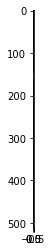

In [180]:
plt.imshow(full[1][10][0,:,:])

In [92]:
patch=patch_extracting(ds,7,7)

===== DETECTED 350 images that contains label no. 3 =====
Extracting patches
(541, 60, 60, 1)


0


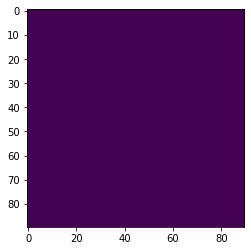

1


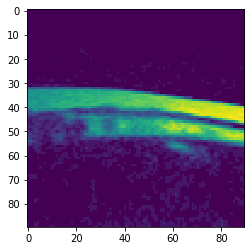

2


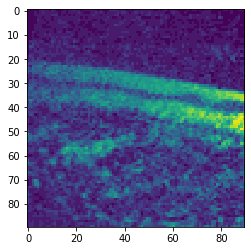

3


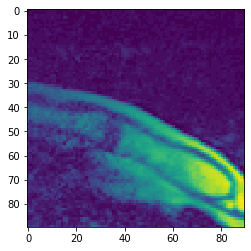

4


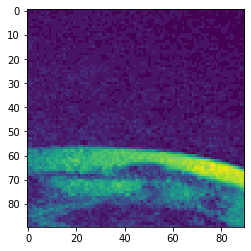

5


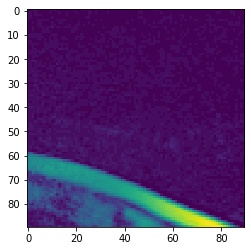

6


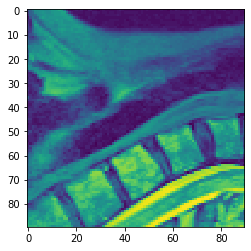

7


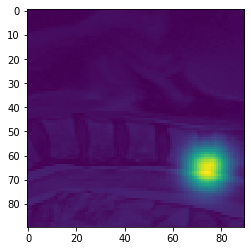

8


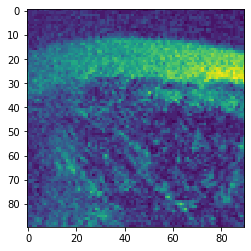

9


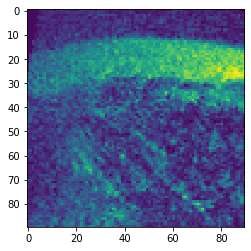

In [45]:
for x in range (len(patch[0][:10])):
    print(x)
    plt.imshow(patch[0][x][:,:,0]+10*patch[1][x][:,:,0])
    plt.show()

In [172]:
t=[18,30,31,32,36,45,46,48,47]

In [27]:
import skimage

In [91]:
full=extract_groundtruth(ds,7,7,10)

===== DETECTED 475 images that contains label no. 10 =====
(3322, 512, 512, 1)


In [188]:
test_ds[0]=test_ds[0][19:]
test_ds[1]=test_ds[1][19:]

In [248]:
full[0]=full[0][1:]
full[1]=full[1][1:]

In [250]:
ds[0]=ds[0][1:]
ds[1]=ds[1][1:]

In [28]:
%matplotlib inline

#### loader for patch

In [105]:
gmdataset_train = EMdataset(image_paths=patch[0][0:510], target_paths=patch[1][0:510])
gmdataset_val = valdataset(image_paths=patch[0][510:], target_paths=patch[1][510:])

print('lendata'+str(len(gmdataset_train)))
train_loader = DataLoader(gmdataset_train, batch_size=20,
                              shuffle=False,
                              num_workers=0)
val_loader = DataLoader(gmdataset_val, batch_size=10,
                            shuffle=False,
                            num_workers=0)


lendata510


In [27]:
import skimage

#### loader for full MRI 

In [113]:
full_dataset_train =valdataset(image_paths=full[0][50:], target_paths=full[1][50:])
full_dataset_val = valdataset(image_paths=full[0][80:], target_paths=full[1][80:])

print('lendata'+str(len(full_dataset_train)))
train_loader = DataLoader(full_dataset_train, batch_size=2,
                              shuffle=False,
                              num_workers=0)
val_loader = DataLoader(full_dataset_val, batch_size=2,
                            shuffle=False,
                            num_workers=0)

lendata425


In [34]:
import copy
from torch.optim.lr_scheduler import StepLR

In [96]:
model = fcn_vl_v3(drop_rate=0.3, bn_momentum=0.1)

In [98]:
model=torch.load('model_c2.pt')

In [106]:
num_epochs = 1000
initial_lr = 0.00005
val_glob=85
optimizer = optim.Adam(model.parameters(), lr=initial_lr)
scheduler = StepLR(optimizer, step_size=200, gamma=0.5)
model=model.double()
model.cuda()
# import ipdb as pdb; pdb.set_trace()
#writer = SummaryWriter(log_dir='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/Unet_FPGA_IVADO-master')
for epoch in tqdm(range(1, num_epochs+1)):
    scheduler.step()


    
    #lr = 0.000025
    #writer.add_scalar('learning_rate', lr, epoch)
    model.train()
    train_loss_total = 0.0
    num_steps = 0
    for i, batch in enumerate(train_loader):
        input_samples, gt_samples = batch[0], batch[1]
        
        var_input = input_samples.cuda()
        var_gt = gt_samples.cuda()

       
        
        #var_input = input_samples
        
        #print(var_input)
        #var_gt = gt_samples
        preds = model(var_input)
        #print(preds)
        #var_gt=var_gt
        #print('predssize'+str(preds.view(-1).size()))
        #print('gt_size'+str(var_gt.view(-1).size()))
        predi=preds.data.cpu().numpy()
        
        inpu=var_input.data.cpu().numpy()
        
        gt_s=var_gt.data.cpu().numpy()
        
        loss=caffe_eucl_loss(var_gt,preds)
        
        loss_2=loss_number_of_point(var_gt,preds)
        loss_2=loss_2.double()
        loss_2=torch.sum(loss_2)
        loss_3=loss_l2_disk(var_gt,preds)
        loss_3=loss_3.double()
        loss_4=dice_loss(var_gt,preds)
        loss_5=AdapWingLoss(preds, var_gt)
        #loss_3=loss_2(preds,var_gt)
        #print(loss_2)
        #loss=dice_loss(predi,gt_s)
       
        # if epoch == 1 and i == len(train_loader) - 1:
        #     import ipdb as pdb; pdb.set_trace()
        # if epoch == 4 and i == len(train_loader) - 1:
        #     import ipdb as pdb; pdb.set_trace()
        train_loss_total += loss.item()
        train_loss_total+=loss_2.item()
        train_loss_total+=loss_3.item()
        #print(train_loss_total)
        #print(train_loss_total)
        #loss_targ=reduce(add, loss_2)
        
        
        #loss_tot=torch.sum(loss_tot)
        #print(loss_tot)
        #loss_tot=loss_tot.double()
        #loss_tot.cuda()

        optimizer.zero_grad()
        loss.backward(retain_graph=True)
        loss_5.backward()
        loss_2.backward()
        #loss_3.backward()
        
        #loss_5.backward()
        optimizer.step()
        
        num_steps += 1
        #print(num_steps)
        #train_loss_total += loss_4.item()
        #train_loss_total += loss_5.item()
        train_loss_total_avg = train_loss_total / num_steps

        # import ipdb as pdb; pdb.set_trace()
    model.eval()
    val_loss_total = 0.0
    num_steps = 0

        

        

    for i, batch in enumerate(val_loader):
        input_samples, gt_samples = batch[0], batch[1]
        

        with torch.no_grad():

            var_input = input_samples.cuda()
            var_gt = gt_samples.cuda()



            preds = model(var_input)

            loss_3=loss_l2_disk(var_gt,preds)
            loss_3=loss_3.double()
            val_loss_total += loss_3.item()
            print(loss_3.item())

        # Metrics computation
        #gt_npy = gt_samples.data.cpu().numpy().astype(np.uint8)
        #gt_npy = gt_npy.squeeze(axis=1)

        #preds = preds.data.cpu().numpy()
       # preds = threshold_predictions(preds)
       # preds = preds.astype(np.uint8)
       # preds = preds.squeeze(axis=1)
   #loss=dice_loss(preds,gt_npy)
   #val_loss_total += loss.item()
       # np.save('result.npy',preds)
       # np.save('gt.npy',gt_npy)
       # input_npy=var_input.data.cpu().numpy()
      #  np.save('input.npy',input_npy)

       # metric_mgr(preds, gt_npy)

        num_steps += 1

   # metrics_dict = metric_mgr.get_results()
   # metric_mgr.reset()

   # writer.add_scalars('metrics', metrics_dict, epoch)

    val_loss_total_avg = val_loss_total / num_steps
    if val_loss_total_avg < val_glob:
        val_glob=copy.deepcopy(val_loss_total_avg)
        best_model = copy.deepcopy(model)
        torch.save(best_model, 'model_c2_40.pt')
    full_inp=transforms.ToTensor()(full[0][1][:256,:256])
    full_inp=full_inp.unsqueeze(0)
    full_inp=full_inp.double()
    full_gt=transforms.ToTensor()(full[1][1][:256,:256])
    full_gt=full_gt.double()
    full_gt=full_gt.unsqueeze(0)
    full_pred=model(full_inp.cuda())
    loss_full=loss_l2_disk(full_pred,full_gt.cuda())
    #loss_full.backward()

    print('losses', {'val_loss': val_loss_total_avg,'train_loss': train_loss_total_avg,'on_full_image':loss_full.item(),'dice':loss_4.item(),'wing':loss_5.item()}, epoch)















  0%|          | 0/1000 [00:00<?, ?it/s]













  0%|          | 1/1000 [00:10<2:49:42, 10.19s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.97834210000872, 'on_full_image': 0.0, 'dice': 0.09788562408873336, 'wing': 4.320479617579689e-07} 1
















  0%|          | 2/1000 [00:20<2:49:49, 10.21s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 25.235665740210372, 'on_full_image': 0.0, 'dice': 0.17086901972804458, 'wing': 9.631442600226202e-07} 2
















  0%|          | 3/1000 [00:30<2:49:27, 10.20s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.59040597351137, 'on_full_image': 0.0, 'dice': 0.40403185842439004, 'wing': 5.4190642680169245e-06} 3
















  0%|          | 4/1000 [00:40<2:49:02, 10.18s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.832724302557672, 'on_full_image': 45.0444221496582, 'dice': 0.031127924618486347, 'wing': 1.8393879255682533e-07} 4
















  0%|          | 5/1000 [00:50<2:48:43, 10.17s/it]

2.2360680103302
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5590170025826, 'train_loss': 28.3132437489514, 'on_full_image': 46.04345703125, 'dice': 0.2628024074746287, 'wing': 2.4521403378776586e-06} 5
















  1%|          | 6/1000 [01:01<2:48:26, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 26.519777591090413, 'on_full_image': 46.010868072509766, 'dice': 0.6748144564620999, 'wing': 2.2900073660794923e-05} 6
















  1%|          | 7/1000 [01:11<2:48:15, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.389603809639677, 'on_full_image': 46.04345703125, 'dice': 0.37780012234379623, 'wing': 4.819835124475628e-06} 7
















  1%|          | 8/1000 [01:21<2:48:04, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.296674095775586, 'on_full_image': 46.04345703125, 'dice': 0.7218674065951991, 'wing': 3.5923677569579276e-05} 8
















  1%|          | 9/1000 [01:31<2:47:55, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.839309422747665, 'on_full_image': 0.0, 'dice': 0.8530748847233586, 'wing': 0.0004123128291265278} 9
















  1%|          | 10/1000 [01:41<2:47:45, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.967178710377897, 'on_full_image': 0.0, 'dice': 0.7868340078221786, 'wing': 5.335016866562805e-05} 10
















  1%|          | 11/1000 [01:51<2:47:37, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.1416501590106, 'on_full_image': 0.0, 'dice': 0.6414914862329595, 'wing': 1.930531361380443e-05} 11
















  1%|          | 12/1000 [02:02<2:47:26, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.055216052801384, 'on_full_image': 0.0, 'dice': 0.3029893180315949, 'wing': 3.970837467708954e-06} 12
















  1%|▏         | 13/1000 [02:12<2:47:12, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 23.78742012435165, 'on_full_image': 46.04345703125, 'dice': 0.5965438855292662, 'wing': 1.2910568757605483e-05} 13
















  1%|▏         | 14/1000 [02:22<2:46:59, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.0432920410282, 'on_full_image': 46.04345703125, 'dice': 0.23818007674500796, 'wing': 2.6506292710166832e-06} 14
















  2%|▏         | 15/1000 [02:32<2:46:45, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.849334406968698, 'on_full_image': 0.0, 'dice': 0.6823997755571685, 'wing': 4.0753399496514185e-05} 15
















  2%|▏         | 16/1000 [02:42<2:46:43, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.142162993352763, 'on_full_image': 0.0, 'dice': 0.37204104683079164, 'wing': 6.722880809622921e-06} 16
















  2%|▏         | 17/1000 [02:52<2:46:36, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.644382423483115, 'on_full_image': 0.0, 'dice': 0.6637435659342794, 'wing': 1.794521562704105e-05} 17
















  2%|▏         | 18/1000 [03:03<2:46:21, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.983351890615058, 'on_full_image': 0.0, 'dice': 0.7336918180734429, 'wing': 4.199216860217532e-05} 18
















  2%|▏         | 19/1000 [03:13<2:46:07, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.163090168458307, 'on_full_image': 46.010868072509766, 'dice': 0.033059528496635515, 'wing': 1.565533574622929e-07} 19
















  2%|▏         | 20/1000 [03:23<2:45:53, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.479865081354944, 'on_full_image': 0.0, 'dice': 0.17573486682446282, 'wing': 1.0468294802411038e-06} 20
















  2%|▏         | 21/1000 [03:33<2:45:51, 10.17s/it]

1.4142135381698608
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.3535533845425, 'train_loss': 28.56041739669827, 'on_full_image': 46.010868072509766, 'dice': 0.07143474199750932, 'wing': 2.4262173289213467e-07} 21
















  2%|▏         | 22/1000 [03:43<2:45:38, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 27.38930558230468, 'on_full_image': 45.0111083984375, 'dice': 0.11042413477553292, 'wing': 6.117218750871629e-07} 22
















  2%|▏         | 23/1000 [03:53<2:45:27, 10.16s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 28.67008521526372, 'on_full_image': 46.04345703125, 'dice': 0.07716668776332347, 'wing': 5.077708960144772e-07} 23
















  2%|▏         | 24/1000 [04:04<2:45:17, 10.16s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 26.885205960266553, 'on_full_image': 46.04345703125, 'dice': 0.9470984632492957, 'wing': 0.0007947297429285995} 24
















  2%|▎         | 25/1000 [04:14<2:45:04, 10.16s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 25.182195225823573, 'on_full_image': 46.04345703125, 'dice': 0.6060346108527914, 'wing': 1.0969704989849064e-05} 25
















  3%|▎         | 26/1000 [04:24<2:44:53, 10.16s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.272963626739514, 'on_full_image': 0.0, 'dice': 0.6655032547164669, 'wing': 1.6511046526562454e-05} 26
















  3%|▎         | 27/1000 [04:34<2:44:40, 10.15s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.111799861699254, 'on_full_image': 0.0, 'dice': 0.5816472943081368, 'wing': 1.4561252575094201e-05} 27
















  3%|▎         | 28/1000 [04:44<2:44:29, 10.15s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.480290581007328, 'on_full_image': 46.04345703125, 'dice': 0.6981981764089562, 'wing': 5.6866395476586355e-05} 28
















  3%|▎         | 29/1000 [04:54<2:44:25, 10.16s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.752382130138532, 'on_full_image': 46.010868072509766, 'dice': 0.5943857276928877, 'wing': 1.120702254951308e-05} 29
















  3%|▎         | 30/1000 [05:04<2:44:17, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.235072439674028, 'on_full_image': 46.010868072509766, 'dice': 0.08769220224558483, 'wing': 3.2387285386464417e-07} 30
















  3%|▎         | 31/1000 [05:15<2:44:09, 10.16s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.09516818377299, 'on_full_image': 46.04345703125, 'dice': 0.8381612001201134, 'wing': 0.00011939688960699368} 31
















  3%|▎         | 32/1000 [05:25<2:44:05, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.12083031362275, 'on_full_image': 46.04345703125, 'dice': 0.8473915905149169, 'wing': 0.00012990791037597365} 32
















  3%|▎         | 33/1000 [05:35<2:43:52, 10.17s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.10969225325173, 'on_full_image': 0.0, 'dice': 0.7789019909326189, 'wing': 7.160586234642044e-05} 33
















  3%|▎         | 34/1000 [05:45<2:43:45, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.090985463275903, 'on_full_image': 0.0, 'dice': 0.3299578043764668, 'wing': 3.468857834516044e-06} 34
















  4%|▎         | 35/1000 [05:55<2:43:32, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 24.346058387157523, 'on_full_image': 46.04345703125, 'dice': 0.6187497714272356, 'wing': 1.782937742167472e-05} 35
















  4%|▎         | 36/1000 [06:05<2:43:21, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.3079458155792, 'on_full_image': 0.0, 'dice': 0.040873035293515714, 'wing': 1.6296181855794217e-07} 36
















  4%|▎         | 37/1000 [06:16<2:43:09, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.540675187646887, 'on_full_image': 0.0, 'dice': 0.16791726522092243, 'wing': 9.136412874314754e-07} 37
















  4%|▍         | 38/1000 [06:26<2:42:59, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.52243066016802, 'on_full_image': 0.0, 'dice': 0.6835411606268944, 'wing': 4.1154601110892215e-05} 38
















  4%|▍         | 39/1000 [06:36<2:42:50, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 27.22684986698656, 'on_full_image': 0.0, 'dice': 0.605901000248963, 'wing': 1.9422671232911303e-05} 39
















  4%|▍         | 40/1000 [06:46<2:42:39, 10.17s/it]

1.4142135381698608
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.3535533845425, 'train_loss': 26.178421436188806, 'on_full_image': 46.04345703125, 'dice': 0.6440015333601355, 'wing': 2.9435714104529214e-05} 40
missing point1
















  4%|▍         | 41/1000 [06:56<2:42:29, 10.17s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 410.218785617127, 'on_full_image': 46.010868072509766, 'dice': 0.7783882309984376, 'wing': 5.488610780240751e-05} 41
















  4%|▍         | 42/1000 [07:06<2:42:19, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.819712391831192, 'on_full_image': 0.0, 'dice': 0.7650855643714656, 'wing': 8.654881053521421e-05} 42
















  4%|▍         | 43/1000 [07:17<2:42:23, 10.18s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 27.352490617917905, 'on_full_image': 46.010868072509766, 'dice': 0.025315049383317523, 'wing': 1.1963597201690178e-07} 43
















  4%|▍         | 44/1000 [07:27<2:42:11, 10.18s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 27.7549382070471, 'on_full_image': 46.010868072509766, 'dice': 0.05530865242528982, 'wing': 5.38630665797392e-07} 44
















  4%|▍         | 45/1000 [07:37<2:41:56, 10.17s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 26.15267778304644, 'on_full_image': 0.0, 'dice': 0.6265315744070379, 'wing': 2.4737175524910142e-05} 45
















  5%|▍         | 46/1000 [07:47<2:41:47, 10.18s/it]

1.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.25, 'train_loss': 25.82740374576418, 'on_full_image': 0.0, 'dice': 0.6420633767674864, 'wing': 3.7721736606441424e-05} 46
















  5%|▍         | 47/1000 [07:57<2:41:42, 10.18s/it]

2.0
missing point1
10000.0
0.0
0.0
losses {'val_loss': 2500.5, 'train_loss': 24.452195843681878, 'on_full_image': 0.0, 'dice': 0.37322774387372426, 'wing': 5.1866872250779325e-06} 47


KeyboardInterrupt: 

In [246]:
best_model = copy.deepcopy(model)
torch.save(best_model,'model_c2_sigma_transf.pt')

In [268]:
torch.cuda.empty_cache()

In [36]:
%matplotlib inline

In [115]:
MSE = nn.MSELoss()

In [393]:
b=transforms.ToTensor()(np.expand_dims(normalize(test_4),axis=-1))
b=b.unsqueeze(0)


In [99]:
len(test_ds[1])

20

In [184]:
test_ds=[[],[]]
for x in t:
    print(x)
    test_ds[0].append(ds[0][x])
    test_ds[1].append(ds[1][x])

18
30
31
32
36
45
46
48
47


In [185]:

for x in range(50,len(ds[0])):
    print(x)
    test_ds[0].append(ds[0][x])
    test_ds[1].append(ds[1][x])

50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193


In [96]:
test_ds[0].append(ds[0][75:])
test_ds[1].append(ds[1][75:])

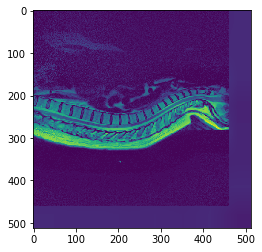

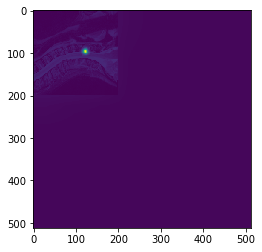

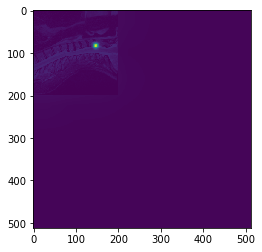

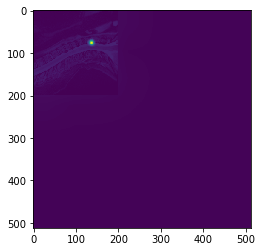

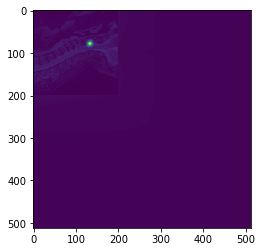

...

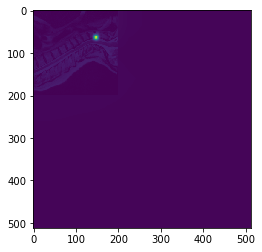

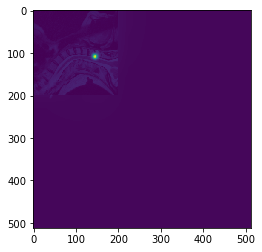

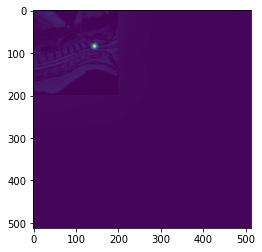

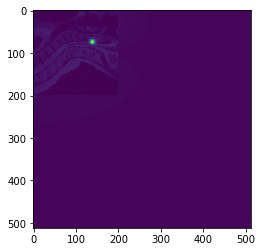

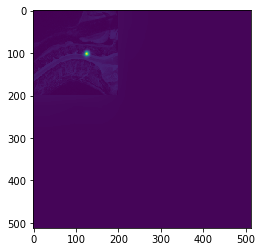

In [107]:
for i in range (50):
    full_inp=transforms.ToTensor()(full[0][i])
    full_inp=full_inp.unsqueeze(0)
    full_inp=full_inp.double()
    full_gt=transforms.ToTensor()(full[1][i])
    full_gt=full_gt.double()
    full_gt=full_gt.unsqueeze(0)
    full_pred=model(full_inp.cuda())
    #loss_full=loss_l2_disk(full_pred,full_gt.cuda())
    predi=full_pred.data.cpu().numpy()
    inpu=full_inp.data.cpu().numpy()
    gt_s=full_gt.data.cpu().numpy()
    overlay0=np.add(predi[0,0,:,:]*10,inpu[0,0,:,:]*1)
    plt.imshow(overlay0)
    plt.show()
    
    

In [259]:
2/50

0.04

In [187]:
model_2 = copy.deepcopy(model)

In [189]:
model_2.dropout=nn.Dropout2d(p=0.4, inplace=False)

In [347]:
full[0][0][0,0]

array([-0.44810405])

In [40]:
predi[0,0,:,:].max()

145.4871676271831

In [558]:
gt_s[0,0,25:35,:].max()

0.9941346

In [539]:
preds[0,0,:,:].argmax()

tensor(821, device='cuda:0')

In [213]:
model=torch.load('model.pt')

In [26]:
import cv2

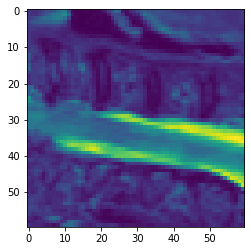

In [155]:
#img_anat = np.dstack((img_anat,img_anat,img_anat))
#img_pred = denormalize2uint8(prediction[0, :,:,0])
overlay=np.add(predi[0,0,:,:]*1,inpu[0,0,:,:]*1)
plt.imshow(overlay[:,:])

In [394]:
b=b.double()
k=model(b.cuda())


0
(512, 512, 1)
(512, 512, 1)


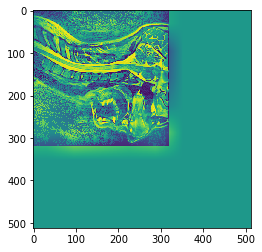

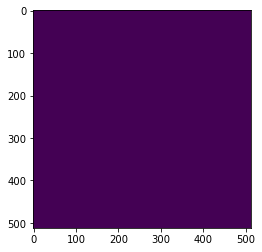

0
(512, 512, 1)
(512, 512, 1)


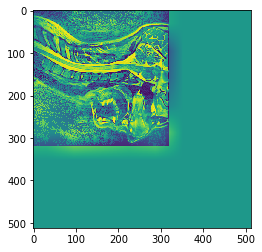

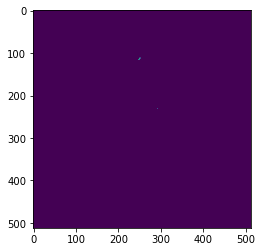

0
(512, 512, 1)
(512, 512, 1)


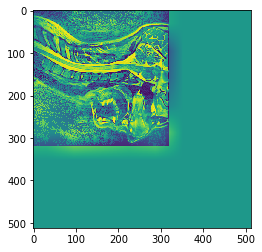

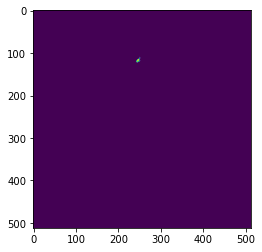

In [109]:
#running test on clip limit
import nibabel as nib 
path_to='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019/flatten_sag.nii'
mri=nib.load(path_to)
testing_im=np.array(mri.dataobj)[64,:,:]
t=[0.2,0.2,0.5]
for i in range (len(t)):
    
    #test_2=np.rot90(testing_im,45,(0,1))
    im_2=images_normalization(testing_im)
    test_3=add_zero_padding(im_2[0], x_val=512, y_val=512)
    print(test_3[0].shape)
    #img_test_clahe=skimage.exposure.equalize_adapthist(normalize(test_3[0][:,:,0]), kernel_size=None, clip_limit=t[i])
    im_inp=images_normalization(normalize(test_3[0][:,:,0]))
    print(test_3[0].shape)
    b=transforms.ToTensor()(np.expand_dims(im_inp[0],axis=-1))
    b=b.unsqueeze(0)
    b=b.double()
    k=model(b.cuda())
    img_res=k.data.cpu().numpy()
    plt.imshow(img_test_clahe[:,:])
    plt.show()
    plt.imshow(img_res[0,0,:,:])
    plt.show()

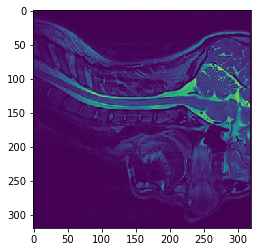

In [409]:
plt.imshow(im_2[0][:,:])

In [146]:
tenso_tes=transforms.ToTensor()(a)

In [78]:
tenso_tes=b.unsqueeze(0)

In [79]:
tenso_tes.size()

torch.Size([1, 1, 256, 256])

In [85]:
res_full_img=model(tenso_tes.cuda())

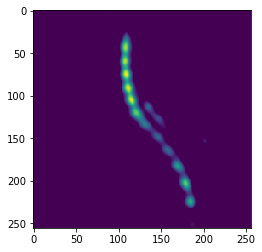

In [38]:
img_res=full_pred.data.cpu().numpy()
#plt.imshow(test_4[:,:])
#plt.show()
plt.imshow(img_res[0,0,:,:])

In [391]:
img_test_clahe=skimage.exposure.equalize_adapthist(normalize(test_3[0][:,:,0]), kernel_size=None, clip_limit=0.08)

In [396]:
im_2=images_normalization(testing_im)

In [397]:
im_2[0]

array([[-0.63391911, -0.63391911, -0.6379791 , ..., -0.6379791 ,
        -0.6379791 , -0.6379791 ],
       [-0.63391911, -0.6379791 , -0.61361914, ..., -0.6379791 ,
        -0.6379791 , -0.6379791 ],
       [-0.6379791 , -0.63391911, -0.56895923, ..., -0.6379791 ,
        -0.6379791 , -0.6379791 ],
       ...,
       [-0.6379791 , -0.6379791 , -0.6379791 , ..., -0.6379791 ,
        -0.6379791 , -0.6379791 ],
       [-0.6379791 , -0.6379791 , -0.6379791 , ..., -0.6379791 ,
        -0.6379791 , -0.6379791 ],
       [-0.6379791 , -0.6379791 , -0.6379791 , ..., -0.6379791 ,
        -0.6379791 , -0.6379791 ]])

In [392]:
test_4=img_test_clahe-img_test_clahe.min()
#test_2=np.rot90(testing_im,45,(0,1))

In [23]:
from __future__ import print_function
import sys; print(sys.version)
import platform; print(platform.platform())
import skimage; print("scikit-image version: {}".format(skimage.__version__))
import numpy; print("numpy version: {}".format(numpy.__version__))

3.7.3 | packaged by conda-forge | (default, Jul  1 2019, 21:52:21) 
[GCC 7.3.0]
Linux-4.15.0-60-generic-x86_64-with-debian-buster-sid
scikit-image version: 0.15.0
numpy version: 1.16.4


In [57]:
test_2=normalize(test_2)

In [22]:
def normalize(arr):
    ma=arr.max()
    mi=arr.min()
    
    return((arr-mi)/(ma-mi))

In [390]:
test_2=np.rot90(im_2[0][:,:],45,(0,1))
test_3=add_zero_padding(test_2, x_val=512, y_val=512)

In [432]:
transforms.ToPILImage()(testing_im)

TypeError: Input type float64 is not supported

In [45]:
%matplotlib inline

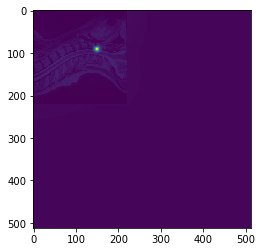

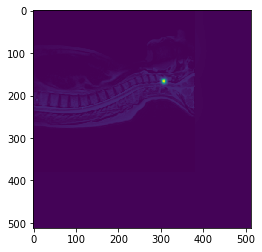

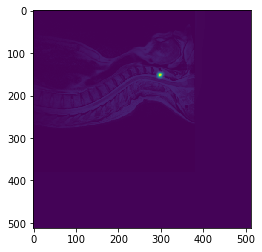

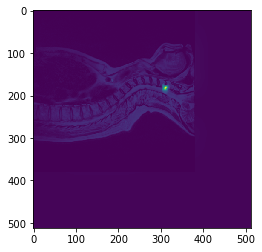

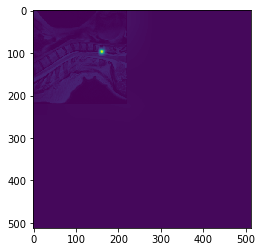

...

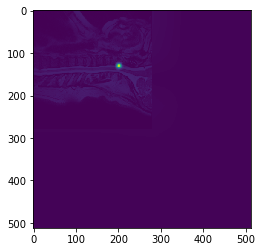

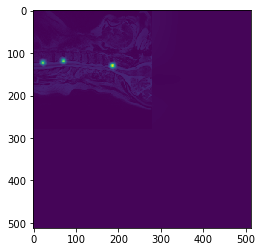

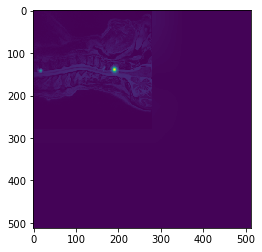

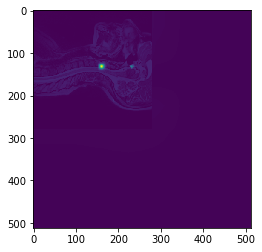

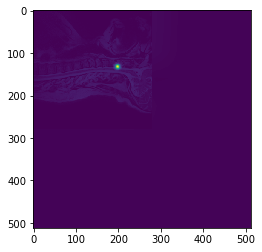

missing point1


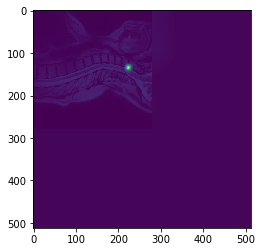

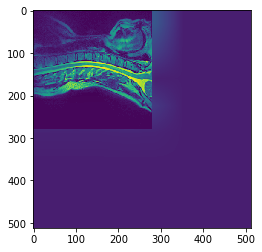

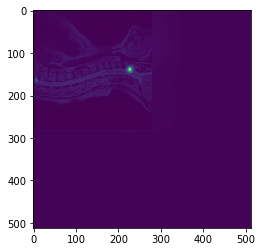

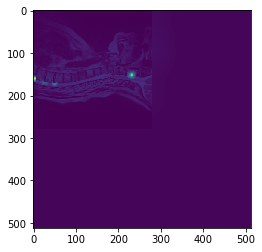

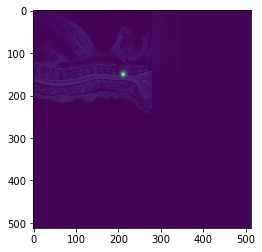

...

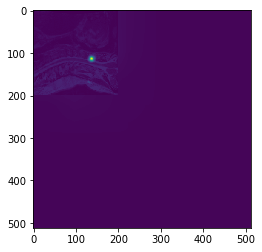

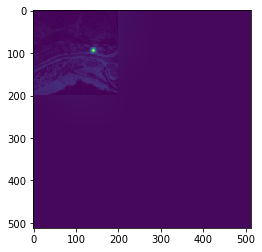

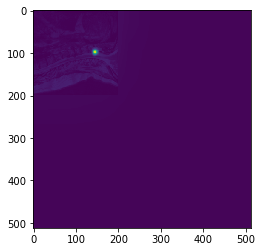

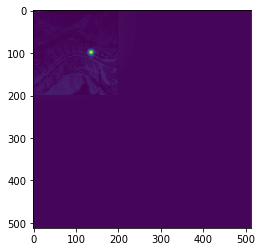

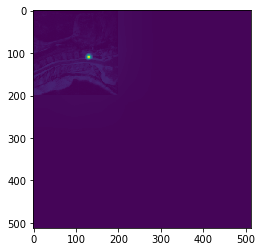

missing point1


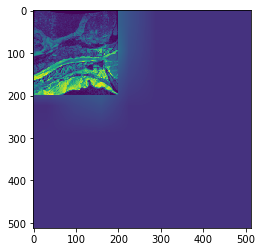

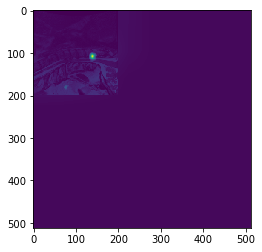

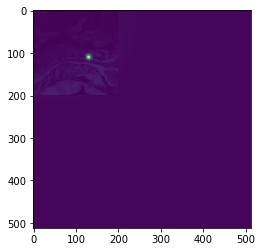

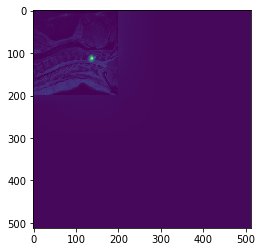

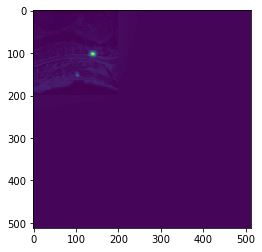

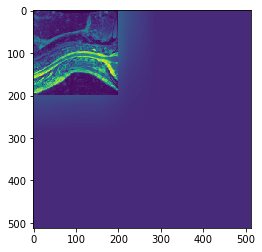

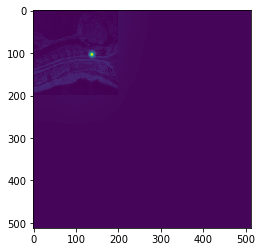

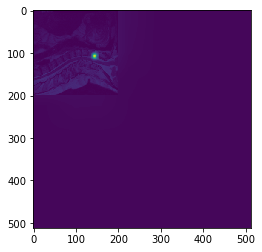

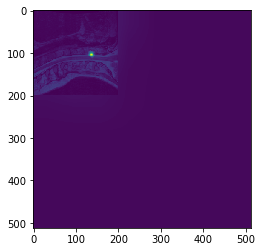

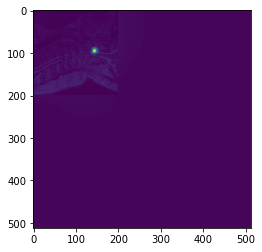

missing point1


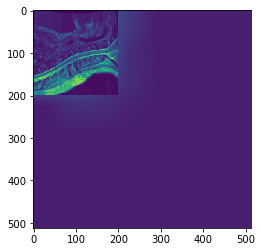

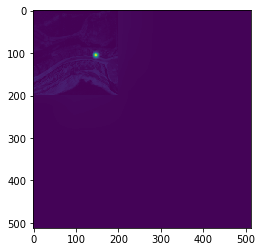

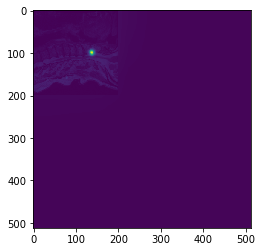

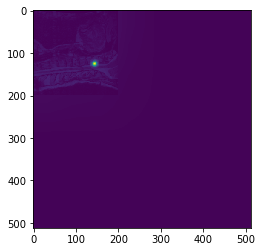

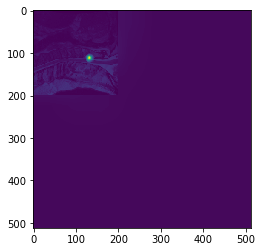

...

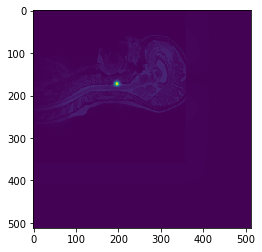

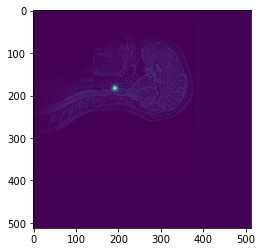

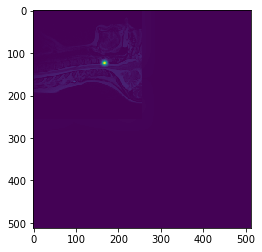

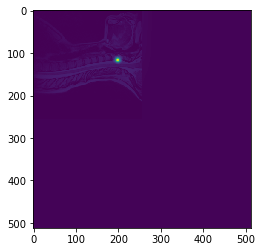

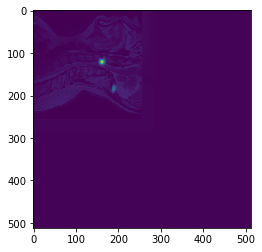

In [114]:
val_loss_total=0
compteur_bete=0
val_loss_no=0
for i, batch in enumerate(train_loader):
            input_samples, gt_samples = batch[0], batch[1]
            

            with torch.no_grad():
                
                var_input = input_samples.cuda()
                var_gt = gt_samples.cuda()
              
                    

                preds = model(var_input)

                loss = loss_l2_disk(var_gt,preds)
                val_loss_total += loss.item()
                if loss.item()>5:
                    compteur_bete=compteur_bete+1
                else :
                    val_loss_no+=loss.item()
                
                predi=preds.data.cpu().numpy()
                gt_s=var_gt.data.cpu().numpy()
                inpu=var_input.data.cpu().numpy()
                for i in range(len(predi)):
                    overlay0=np.add(predi[i,0,:,:]*10,inpu[i,0,:,:]*1)
                    plt.imshow(overlay0)
                    plt.show()
               # overlay1=np.add(predi[1,0,:,:]*10,inpu[1,0,:,:]*1)
               # plt.imshow(overlay1)
               # plt.show()

            # Metrics computation
            #gt_npy = gt_samples.data.cpu().numpy().astype(np.uint8)
            #gt_npy = gt_npy.squeeze(axis=1)

            #preds = preds.data.cpu().numpy()
           # preds = threshold_predictions(preds)
           # preds = preds.astype(np.uint8)
           # preds = preds.squeeze(axis=1)
	   #loss=dice_loss(preds,gt_npy)
	   #val_loss_total += loss.item()
           # np.save('result.npy',preds)
           # np.save('gt.npy',gt_npy)
           # input_npy=var_input.data.cpu().numpy()
          #  np.save('input.npy',input_npy)

           # metric_mgr(preds, gt_npy)

           

       # metrics_dict = metric_mgr.get_results()
       # metric_mgr.reset()

       # writer.add_scalars('metrics', metrics_dict, epoch)

            #val_loss_total_avg = val_loss_total / num_steps
        
     
        

In [115]:
val_loss_total/425

77.58648670420928

In [116]:
compteur_bete/425

0.05647058823529412

In [117]:
val_loss_no/(425-compteur_bete)

0.9134538572030769

##### Sigma 20 
Patch training. 75 never seen images (no patch extracted) in test on a total of 425 images. 
Loss on 425 images :8.70
percentage of outlier (loss >5): 1,7%
Loss when not considering the outlier : 0.77 

summary : It is working 98 % of the time and is within the mm of difference when it is. (theoritically) 

##### sigma 40
Patch training. 75 never seen images (no patch extracted) in test on a total of 425 images. 
Loss on 425 images :240
percentage of outlier (loss >5): 8,7%
Loss when not considering the outlier : 1,10

summary : It is working 92 % of the time and is within 2 mm of difference when it is. (theoritically) 

#### sigma 30
patch training 75 never seen befor images.
loss on 425 images : 75 
outlier : 7% 
loss when no outlier : 1.06

#### sigma 10 
not working because it is not training on 30x30 patch.

#### sigma 15
Patch training. 75 never seen images (no patch extracted) in test on a total of 425 images. 
Loss on 425 images :638(due to missing point perhaps)
percentage of outlier (loss >5): 8,3%
Loss when not considering the outlier : 0.90

summary : It is working 92 % of the time and is within the mm of difference when it is. (theoritically) 

#### Last experiment : transfer learning sigma 15 to sigma 10 
patch training 75 never seen befor images.
loss on 425 images : 52 
outlier : 1.8% 
loss when no outlier : 0.86

In [55]:
%matplotlib inline

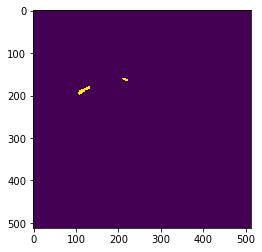

In [41]:
plt.imshow(test[0,0,:,:])

In [26]:
import nibabel as nib

In [57]:
path_to='/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019/flatten_sag.nii'

In [58]:
testing_im=nib.load(path_to)

In [59]:
testing_im=np.array(testing_im.dataobj)

In [60]:
testing_im.shape

(129, 320, 320)

In [61]:
testing_im=testing_im[64,:,:]

In [62]:
testing_im=np.expand_dims(testing_im,axis=-1)

In [31]:
import skimage


Usage:   
  pip install [options] <requirement specifier> [package-index-options] ...
  pip install [options] -r <requirements file> [package-index-options] ...
  pip install [options] [-e] <vcs project url> ...
  pip install [options] [-e] <local project path> ...
  pip install [options] <archive url/path> ...

no such option: -u


In [325]:
testing_im=testing_im*255*255

In [338]:
testing_im=testing_im.astype('uint16')

In [543]:
preds[0][0].size()[0]

40

In [547]:
index= preds[0][0].argmax()
rows = index / 40
cols = index % 40
print(preds[0][0][rows,cols])

tensor(0.8352, device='cuda:0', grad_fn=<SelectBackward>)


In [576]:
a=(torch.abs((torch.max(preds[0][0]).item()-preds[0][0]))<0.006).nonzero()

In [570]:
lis_p=(torch.abs((torch.max(var_gt[0][0]).item()-var_gt[0][0]))<0.006).nonzero()

In [87]:
var_gt[0][0]

tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., 4.5818e-289,
         2.5983e-292, 1.4016e-295],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., 1.2116e-287,
         6.8707e-291, 3.7062e-294],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ..., 3.0475e-286,
         1.7282e-289, 9.3225e-293],
        ...,
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00]], device='cuda:0', dtype=torch.float64)

In [92]:
((torch.max(var_gt[0][0]).item()-var_gt[0][0])<0.004).nonzero()

tensor([[ 97, 362],
        [110, 363]], device='cuda:0')

In [110]:
var_gt[0][0][100,361]

tensor(0.8534, device='cuda:0', dtype=torch.float64)

In [25]:
def loss_spinal_cord(y_true,y_pred):
    loss=torch.tensor(0)
    for i in range (y_true.size()[0]):
        print(i)
        
        list_true=(torch.abs((torch.max(y_true[i][0]).item()-y_true[i][0]))<0.004).nonzero()
        list_pred=(torch.abs((torch.max(y_pred[i][0]).item()-y_pred[i][0]))<0.004).nonzero()

        if list_true.size()==torch.Size([0, 0]):
            pass
        else:
            #print(list_true)
            x_true=list_true[:,0]
            x_pred=list_pred[:,0]
            print(x_pred)
            diff=(torch.abs((torch.max(x_true).item()-x_pred))>5).nonzero()
            print(diff)
    

In [26]:
def loss_number_of_point(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
       # print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<10).nonzero()
        #print(list_true)
        if list_pred.size()[0]<list_true.size()[0]:
            loss=torch.tensor([float(list_true.size()[0]-list_pred.size()[0])],requires_grad=True)
            print(loss.item())
            loss_tot=torch.cat((loss_tot,loss))
        else:
            loss=torch.tensor([1.0],requires_grad=True)
            loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(loss_tot)

In [88]:
testing_coord=ds[1][0]

In [89]:
testing_coord

[[25, 266, 414, 1],
 [25, 262, 386, 3],
 [25, 260, 370, 4],
 [25, 254, 357, 5],
 [25, 250, 343, 6],
 [25, 243, 328, 7],
 [25, 235, 316, 8],
 [25, 225, 300, 9],
 [25, 214, 284, 10],
 [25, 205, 266, 11],
 [25, 196, 247, 12],
 [25, 188, 225, 13],
 [25, 188, 207, 14],
 [25, 189, 186, 15],
 [25, 192, 162, 16],
 [25, 200, 138, 17],
 [25, 206, 114, 18],
 [25, 212, 88, 19],
 [25, 221, 61, 20],
 [25, 228, 33, 21],
 [25, 235, 4, 22],
 [25, 244, 431, 49],
 [25, 255, 440, 50]]

In [102]:
def test_label2mask(data, c_dx = 0, c_dy = 0, radius = 10, normalize = False):
    """
    Generate a Mask map from the coordenates
    :param M, N: dimesion of output
    :param position: position of the label
    :param radius: is the radius of the gaussian function
    :return: a MxN normalized array
    """

    # Our 2-dimensional distribution will be over variables X and Y
    (M,N)=(512,512)
    if len(data)<=2:
        data = [data]

    maskMap = []
    for index, value in enumerate(data):
        x,y = value

        #Correct the labels
        #x = x + c_dx
        #y = y + c_dy

        X = np.linspace(0, M - 1, M)
        Y = np.linspace(0, N - 1, N)
        X, Y = np.meshgrid(X, Y)
        # Pack X and Y into a single 3-dimensional array
        pos = np.empty(X.shape + (2,))
        pos[:, :, 0] = X
        pos[:, :, 1] = Y
        print(pos)

        # Mean vector and covariance matrix
        mu = np.array([x, y])
        Sigma = np.array([[radius, 0], [0, radius]])

        # The distribution on the variables X, Y packed into pos.
        Z = multivariate_gaussian(pos, mu, Sigma)

        # Normalization
        if normalize:
            Z = Z * (1 / np.max(Z))
        else:
            # 8bit image values (the loss go to inf+)
            Z = Z * (1 / np.max(Z))
            Z = np.asarray(Z * 255, dtype=np.uint8)

        maskMap.append(Z)

    if len(maskMap) == 1:
        maskMap = maskMap[0]

    return np.asarray(maskMap)

In [103]:
testing = test_label2mask(ds[1][0][1:3], radius = 10, normalize = True)

[[[  0.   0.]
  [  1.   0.]
  [  2.   0.]
  ...
  [509.   0.]
  [510.   0.]
  [511.   0.]]

 [[  0.   1.]
  [  1.   1.]
  [  2.   1.]
  ...
  [509.   1.]
  [510.   1.]
  [511.   1.]]

 [[  0.   2.]
  [  1.   2.]
  [  2.   2.]
  ...
  [509.   2.]
  [510.   2.]
  [511.   2.]]

 ...

 [[  0. 509.]
  [  1. 509.]
  [  2. 509.]
  ...
  [509. 509.]
  [510. 509.]
  [511. 509.]]

 [[  0. 510.]
  [  1. 510.]
  [  2. 510.]
  ...
  [509. 510.]
  [510. 510.]
  [511. 510.]]

 [[  0. 511.]
  [  1. 511.]
  [  2. 511.]
  ...
  [509. 511.]
  [510. 511.]
  [511. 511.]]]


ValueError: operands could not be broadcast together with shapes (512,512,2) (2,4) 

In [ ]:
l

In [131]:
test=gt_s[0,0,:500,:500]>0.8

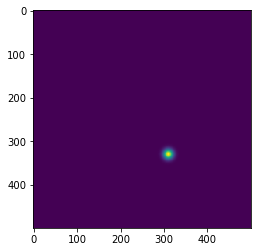

In [133]:
plt.imshow(gt_s[0,0,:500,:500])

In [51]:
predi[0,0,:,:].max()

136.60435478797402

In [59]:
loss_ivdist(var_gt,preds)

0
tensor([[158, 303],
        [158, 304],
        [158, 305],
        [158, 306],
        [158, 307],
        [159, 301],
        [159, 302],
        [159, 303],
        [159, 304],
        [159, 305],
        [160, 301],
        [160, 302]], device='cuda:0')
tensor([[156, 312],
        [156, 313],
        [156, 314],
        [164, 278],
        [164, 279],
        [167, 245],
        [167, 246],
        [168, 245],
        [168, 246]], device='cuda:0')


tensor(6., grad_fn=<SumBackward0>)

In [41]:
def loss_ivdist(y_true,y_pred):
    loss_tot=torch.tensor([0.0], requires_grad=True)
    for i in range (y_true.size()[0]):
        #print(i)
        
        list_true=(torch.abs((y_true[i][0]-torch.max(y_true[i][0]).item()))<0.00001).nonzero()
        list_pred=(torch.abs((y_pred[i][0]-torch.max(y_pred[i][0]).item()))<0.04).nonzero()
        #print(list_true)
        #print(list_pred)
        if list_true.size()==torch.Size([0, 0]):
            pass
        else:
            c=0
            for j in range (list_pred.size()[0]-1):
                if (list_pred[j][1]-list_pred[j+1][1])<4:
                    loss=torch.tensor([1.0],requires_grad=True)
                    loss_tot=torch.cat((loss_tot,loss))
    #requires_grad_(requires_grad=True) → loss_tot
    return(torch.sum(loss_tot))

In [145]:
np.nonzero((abs((full[1][0].max()-full[1][0]))<0.011))

(array([ 42,  59,  75,  89, 104, 120, 134, 149, 164, 182, 202]),
 array([106, 106, 108, 112, 115, 122, 132, 146, 159, 169, 179]),
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]))

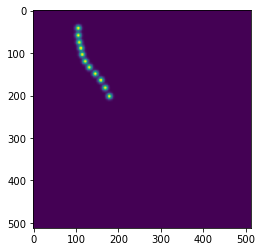

In [146]:
plt.imshow(full[1][0][:,:,0])

In [140]:
full[1][0].max()

256.00000000000136

In [220]:

flatten_sagittal('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2.nii.gz','/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2_centerline.nii.gz')


ImportError: cannot import name 'get_orientation' from 'sct_image' (/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/sct/sct/scripts/sct_image.py)

In [221]:
pwd

'/home/GRAMES.POLYMTL.CA/luroub/luroub_local/lurou_local/deep_VL_2019'

In [132]:
a=get_x_label_coordenates_list(ds[1],5)

In [194]:
tmp_train_img=[]
tmp_train_labels=[]
t=os.listdir('PolyDatabase_2')
t.sort()
t.remove('.DS_Store')
for lbs in range(len(ds[1])):
    if get_x_label_coordenates_exist(ds[1][lbs], 5):
                tmp_train_img.append(ds[0][lbs])
                tmp_train_labels.append(ds[1][lbs])
    else:
            print(lbs)
            print(t[516+lbs])

In [152]:
for x in range (3,14):
    for lbs in range(len(tmp_train_labels)):
        var=get_x_label_coordenates_exist(tmp_train_labels[lbs],x)
        if var :
            pass
        else:
            

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [153]:
len(ds[0])

528

In [185]:
for lbs in range(len(ds[1])):
    if get_x_label_coordenates_exist(ds[1][lbs], 5):
                tmp_train_img.append(ds[0][lbs])
                tmp_train_labels.append(ds[1][lbs])
    else:
            print(lbs)
         
       

16


In [170]:
t=os.listdir('PolyDatabase_2')

In [171]:
t.sort()

In [173]:
t[513]

'unf_d-sp-pain_25'

In [30]:
import dsntnn

In [62]:
class CoordRegressionNetwork(nn.Module):
    def __init__(self, n_locations):
        super().__init__()
        self.net = model
        self.hm_conv = nn.Conv2d(1, n_locations, kernel_size=1, bias=False)

    def forward(self, images):
        # 1. Run the images through our FCN
        image=transforms.ToTensor()(images).unsqueeze(0).cuda()
        net_out = self.net(image)
        # 2. Use a 1x1 conv to get one unnormalized heatmap per location
        
        # 3. Normalize the heatmaps
        
        # 4. Calculate the coordinates
        coords = nn.Linear(10, 2)(net_out).cuda()

        return coords, heatmaps

In [63]:
import matplotlib.pyplot as plt
import scipy.misc

In [64]:
model_coord = CoordRegressionNetwork(n_locations=2)
model_coord=model_coord.double()
model_coord=model_coord.cuda()

In [65]:
coords, heatmaps = model_coord(ds[0][1])

RuntimeError: Expected object of backend CUDA but got backend CPU for argument #2 'mat2'

In [35]:
%matplotlib inline

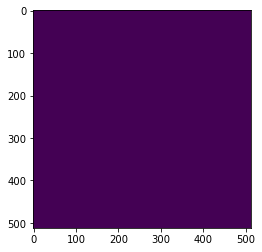

In [53]:
plt.imshow(heatmaps.data.cpu()[0,0,:,:])

In [54]:
coords

tensor([[[0., 0.],
         [0., 0.]]], device='cuda:0', dtype=torch.float64,
       grad_fn=<FlipBackward>)

In [225]:
coord_gt=[]
for i in range (len(ds[1])):
    coord_tmp=[[],[]]
    for j in range(len(ds[1][i])):
        if ds[1][i][j][3]==1 or ds[1][i][j][3]>30:
            pass
        else:
            coord_tmp[0].append(ds[1][i][j][2])
            coord_tmp[1].append(ds[1][i][j][1])
    coord_gt.append(coord_tmp)

In [ ]:
optimizer = optim.RMSprop(model.parameters(), lr=2.5e-4)
hard=[]
c=0
compteur_bonus=0
for i in range(len(ds[0])):
    # Forward pass
    images= ds[0][i]
    
    #print(torch.tensor(coord_gt[i])[:,:x])
    image=transforms.ToTensor()(images).unsqueeze(0).cuda()
    net_out = model(image)
    net_out=net_out.data.cpu().numpy()
    plt.imshow(np.add(net_out[0,0,:,:]*10,images[:,:,0]))
    plt.show()
    coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.9)
    
    euc_loss,missing=spec_eucl_loss_2(coord_gt[i],coordinates)
    if missing>1:
        hard.append(i)
        c=c+1
    # Per-location regularization losses
    #reg_losses = dsntnn.js_reg_losses(heatmaps, torch.tensor(coord_gt[i])[:,:x].double().cuda(), sigma_t=1.0)
    # Combine losses into an overall loss
    print('before patch inference')
    print(euc_loss)
    print('after_patch')
    final=infer(images,coordinates,net_out)
    if len(coordinates)>0:
        coordinates = peak_local_max(final[0,0,:,:],min_distance=1, threshold_rel=0.9)
        plt.imshow(np.add(final[0,0,:,:]*10,images[:,:,0]))
        plt.show()
        euc_loss,missingp=spec_eucl_loss_2(coord_gt[i],coordinates)
        if missing>missingp:
            compteur_bonus=compteur_bonus+1
        print(euc_loss)
    
# Predictions after training
print(compteur_bonus)
#plt.imshow(heatmaps[0, 0].detach().cpu().numpy())
#plt.show()

In [ ]:
len(hard)/len(ds[0])
print(compteur_bonus)

In [80]:
image=transforms.ToTensor()(ds[0][0]).unsqueeze(0).cuda()
net_out = model(image)
net_out=net_out.data.cpu().numpy()

TypeError: Invalid shape (512, 512, 1) for image data

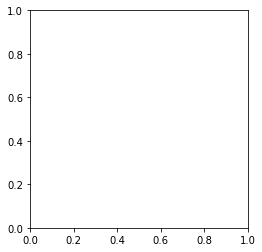

In [69]:
plt.imshow(ds[0][1])

In [86]:
a=abs(net_out[0,0,:,:]-net_out[0,0,:,:].max())<0.1

In [31]:
import numpy as np
from skimage.feature import peak_local_max

In [227]:
coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.9)

In [195]:
net_out[0,0,:,:].max()

1.1267215542706888

In [148]:

def spec_eucl_loss_2(y_true,y_pred):
   
    loss=0
    for i in range (len(y_pred)):
        x=y_pred[i]
        my_num=x[1]
        res=min(y_true[0], key=lambda x:abs(x-my_num))
        test_i=y_true[0].index(res)
        real_disc=[y_true[1][test_i],y_true[0][test_i]]
        loss=loss+np.linalg.norm(real_disc-x)
    a=len(y_true[0])-len(y_pred)

    print('missing point'+ str(len(y_true[0])-len(y_pred)))
    return (loss,a)

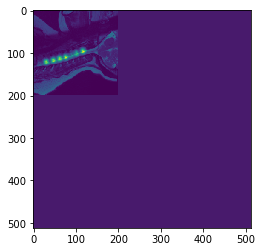

5
[[121  31]
 [117  47]
 [113  62]
 [109  76]
 [ 95 116]]
25


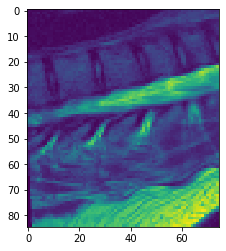

55


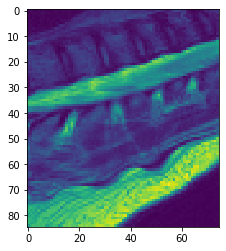

85


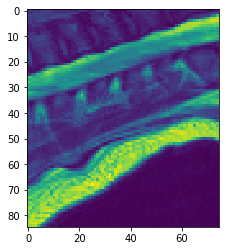

115


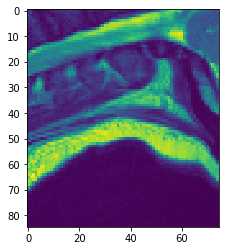

145


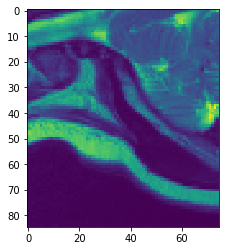

175


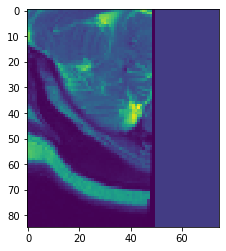

205


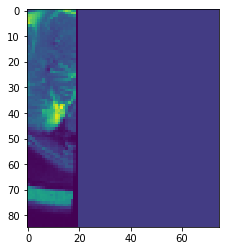

235


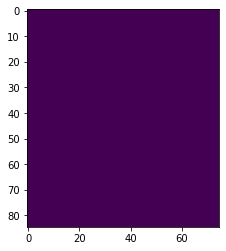

265


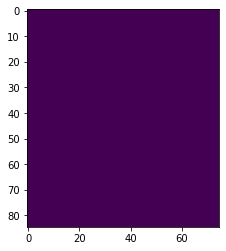

295


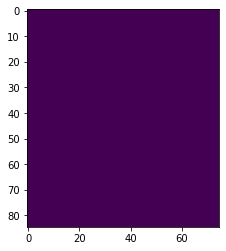

325


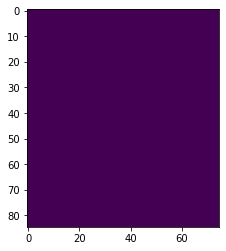

355


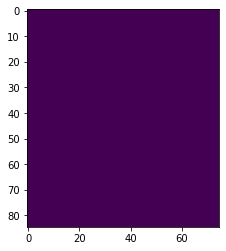

385


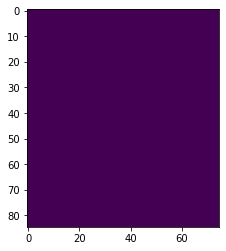

415


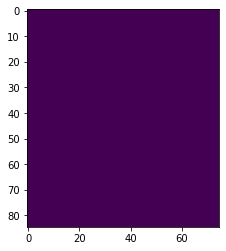

445


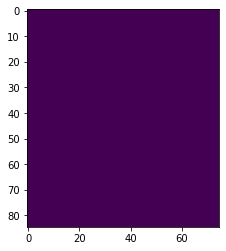

475


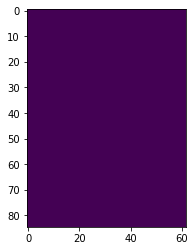

3
[[121  31]
 [117  47]
 [109  76]]


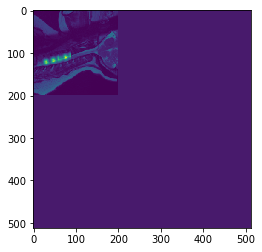

In [326]:
images= ds[0][50]
image=transforms.ToTensor()(images).unsqueeze(0).cuda()
net_out = model(image)
net_out=net_out.data.cpu().numpy()
plt.imshow(np.add(net_out[0,0,:,:]*10,images[:,:,0]))
plt.show()
coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.9)
print(len(coordinates))
print(coordinates)
final=infer(images,coordinates,net_out)   
coordinates = peak_local_max(final[0,0,:,:],min_distance=1, threshold_rel=0.9)
print(len(coordinates))
print(coordinates)
plt.imshow(np.add(final[0,0,:,:]*10,images[:,:,0]))
plt.show()

In [329]:
 def infer(image,coordinates,curr_heatmap):
        
        final=copy.deepcopy(curr_heatmap)
        #retrieve coordinates of extreme point
        coordinates.sort()
        originx=coordinates[-1][0]
        #originx=6
        originy=25
        while originy+30< image.shape[0]:
            #print(originy)
            patch=image[originx-5:originx+80,originy-25:originy+50,0]
            #patch=skimage.exposure.equalize_adapthist(normalize(patch), kernel_size=None, clip_limit=0.000002)
            #plt.imshow(patch)
            #plt.show()
            patch=np.expand_dims(patch,axis=-1)
            patch=transforms.ToTensor()(patch).unsqueeze(0).cuda()
            patch_out= model(patch)
            patch_out=patch_out.data.cpu().numpy()
            
            final[0,0,originx-5:originx+80,originy-25:originy+50]=patch_out[0,0,:,:]
            originy=originy+30
        return (final)
            
    
    #infer on patches and modify output 
    #retake the coordinates
    #output it
    # Per-location euclidean losses

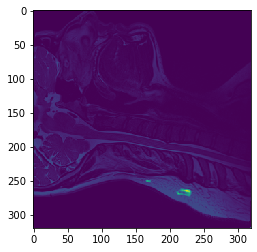

NameError: name 'infer' is not defined

In [63]:
testing_im=nib.load('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/t2_flatten.nii.gz')
testing_arr=np.array(testing_im.dataobj)
mid=int(np.round(testing_arr.shape[0]/2))
images=testing_arr[mid,:,:]

images=np.rot90(images,k=2,axes=(0,1))
images=normalize(images)
#images=skimage.exposure.equalize_adapthist(normalize(images), kernel_size=None, clip_limit=0.02)
images=np.expand_dims(images,axis=-1)
image=transforms.ToTensor()(images).unsqueeze(0).cuda()
image=image.double()
net_out = model(image)
net_out=net_out.data.cpu().numpy()
plt.imshow(np.add(net_out[0,0,:,:]*100,images[:,:,0]))
plt.show()


In [64]:
def load_Data_just_check(DataSet_path):
    size_val = 512
    ds_image=[]
    ds_label=[]
    list_dir=os.listdir(DataSet_path)
    list_dir.sort()
    if '.DS_Store' in list_dir:
        list_dir.remove('.DS_Store')
    a=len(list_dir)
    for i in range (a):
        path_tmp=DataSet_path
       
        
        mid_slice=get_midNifti(path_tmp+'t2_flatten.nii.gz',25)
        print(mid_slice.shape)
        if mid_slice.shape[0]>512:
            print('removed')
            pass
        elif mid_slice.shape[1]>512:
            print('removed')
            pass
        else:
            ds_image.append(mid_slice)
           
    
    ds_image = images_normalization(ds_image)
    

    # Zero padding
    ds_image = add_zero_padding(ds_image, x_val=size_val, y_val=size_val)
    #val_ds_img = add_zero_padding(val_ds_img, x_val=size_val, y_val=size_val)
    #test_ds_img = add_zero_padding(test_ds_img, x_val=size_val, y_val=size_val)

    # Convert images to np.array
    ds_image = np.array(ds_image)
        
        
    return [ds_image,ds_label] 

In [65]:
mid_check=load_Data_just_check('/home/GRAMES.POLYMTL.CA/luroub/sct_example_data/t2/')

(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
(320, 320)
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


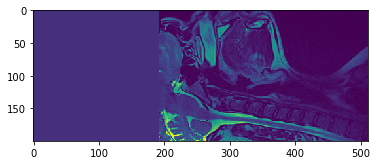

[]
0
[]


NameError: name 'infer' is not defined

In [79]:
images= mid_check[0][0][100:300]
images=np.rot90(images,k=2,axes=(0,1))
images=normalize(images)
image=transforms.ToTensor()(images).unsqueeze(0).cuda()
net_out = model(image)
net_out=net_out.data.cpu().numpy()
plt.imshow(np.add(net_out[0,0,:,:],images[:,:,0]))
plt.show()
coordinates = peak_local_max(net_out[0,0,:,:],min_distance=1, threshold_rel=0.9)
print(coordinates)
sorted(coordinates,key = lambda x: x[0])
print(len(coordinates))
print(coordinates)
final=infer(images,coordinates,net_out)   
coordinates = peak_local_max(final[0,0,:,:],min_distance=1, threshold_rel=0.9)
print(len(coordinates))
print(coordinates)
plt.imshow(np.add(final[0,0,:,:]*10,images[:,:,0]))
plt.show()

In [76]:
full[0][0].mean()

0.12227989595749132

In [78]:
normalize(mid_check[0][0])

array([[[0.00000000e+00],
        [0.00000000e+00],
        [2.66877560e-04],
        ...,
        [1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01]],

       [[0.00000000e+00],
        [1.01118096e-04],
        [0.00000000e+00],
        ...,
        [1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01]],

       [[0.00000000e+00],
        [0.00000000e+00],
        [0.00000000e+00],
        ...,
        [1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01]],

       ...,

       [[1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01],
        ...,
        [1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01]],

       [[1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01],
        ...,
        [1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01]],

       [[1.38975017e-01],
        [1.38975017e-01],
        [1.38975017e-01],
        ...,
        [1.38975017e-01],
        [1.3897